# EDA

In [1]:
cd /home/mffang/workspace/Poisson-regression

/home/mffang/workspace/Poisson-regression


In [2]:
# Load before numpy to restrict its usage of cores, otherwise it will use all cores when doing @
import os
os.environ["BLAS_NUM_THREADS"] = "1" 
os.environ["OPENBLAS_NUM_THREADS"] = "1" # 

import RADOM
print(RADOM.__version__)

from RADOM.inference import Trajectory
from RADOM.mixtures import PoissonMixture, GammaPoissonMixture
from RADOM.preprocess import *
from RADOM.plotting import *

2023.06.07


In [11]:
from scipy.stats import spearmanr
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cmasher as cmr
from tqdm import tqdm
import copy

## Dynamo

In [15]:
import dynamo as dyn
import warnings

warnings.filterwarnings("ignore")

adata_hsc_raw = sc.read('./data/hematopoiesis_raw.h5ad')
adata_hsc_raw

AnnData object with n_obs × n_vars = 1947 × 26193
    obs: 'batch', 'cell_type', 'time'
    var: 'gene_name_mapping'
    uns: 'genes_to_use'
    obsm: 'X_umap'
    layers: 'new', 'spliced', 'total', 'unspliced'

ValueError: x and y can be no greater than 2D, but have shapes (1947, 0, 21595) and (1947, 0, 21595)

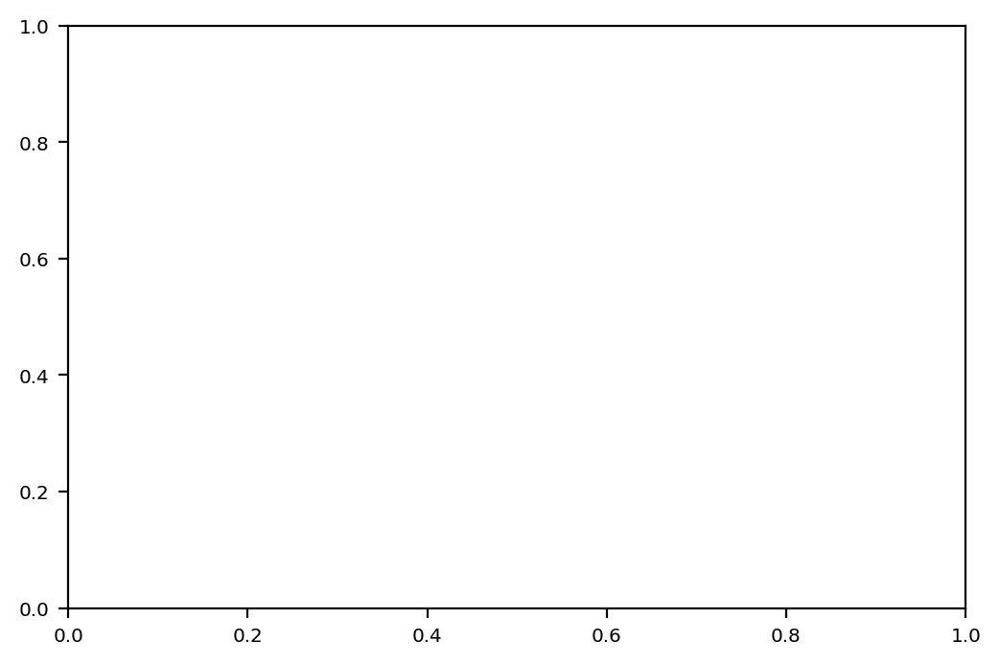

In [297]:
j = fitted_idx[0]
plt.plot(adata_hsc_raw.layers['new'].toarray()[:,j],adata_hsc_raw.layers['total'].toarray()[:,j])

In [6]:
selected_genes_to_use = adata_hsc_raw.uns["genes_to_use"]

preprocessor = dyn.pp.Preprocessor(force_gene_list=selected_genes_to_use)
preprocessor.config_monocle_recipe(adata_hsc_raw, n_top_genes=len(selected_genes_to_use))
preprocessor.preprocess_adata_monocle(
    adata_hsc_raw,
    tkey="time",
    experiment_type="one-shot",
)

dyn.tl.reduceDimension(adata_hsc_raw)

dyn.tl.moments(adata_hsc_raw, group="time")

adata_hsc_raw.uns["pp"]["has_splicing"] = False
dyn.tl.dynamics(adata_hsc_raw, group="time", one_shot_method="sci_fate", model="deterministic");

/home/mffang/miniconda3/envs/python_3.8/lib/python3.8/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/mffang/miniconda3/envs/python_3.8/lib/python3.8/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/mffang/miniconda3/envs/python_3.8/lib/python3.8/site-pac

|-----> Running monocle preprocessing pipeline...
|-----> convert ensemble name to official gene name
|-----? Your adata object uses non-official gene names as gene index. 
Dynamo is converting those names to official gene names.
|-----> Storing myGene name info into local cache db: mygene_cache.sqlite.
Error: The requests_cache python module is required to use request caching.
See - https://requests-cache.readthedocs.io/en/latest/user_guide.html#installation
querying 1-1000...done.
querying 1001-2000...done.
querying 2001-3000...done.
querying 3001-4000...done.
querying 4001-5000...done.
querying 5001-6000...done.
querying 6001-7000...done.
querying 7001-8000...done.
querying 8001-9000...done.
querying 9001-10000...done.
querying 10001-11000...done.
querying 11001-12000...done.
querying 12001-13000...done.
querying 13001-14000...done.
querying 14001-15000...done.
querying 15001-16000...done.
querying 16001-17000...done.
querying 17001-18000...done.
querying 18001-19000...done.
queryin

estimating alpha: 100%|██████████| 1754/1754 [00:00<00:00, 71817.19it/s]


|-----> calculating first/second moments...
|-----> [moments calculation] completed [3.0962s]
|-----? Your adata only has labeling data, but `NTR_vel` is set to be `False`. Dynamo will reset it to `True` to enable this analysis.


estimating alpha: 100%|██████████| 1754/1754 [00:00<00:00, 74284.94it/s]


In [296]:
adata_hsc_raw

AnnData object with n_obs × n_vars = 1947 × 21595
    obs: 'batch', 'cell_type', 'time', 'nGenes', 'nCounts', 'pMito', 'pass_basic_filter', 'Size_Factor', 'initial_cell_size', 'unspliced_Size_Factor', 'initial_unspliced_cell_size', 'new_Size_Factor', 'initial_new_cell_size', 'total_Size_Factor', 'initial_total_cell_size', 'spliced_Size_Factor', 'initial_spliced_cell_size', 'ntr'
    var: 'gene_name_mapping', 'nCells', 'nCounts', 'query', 'scopes', '_id', '_score', 'symbol', 'pass_basic_filter', 'score', 'log_cv', 'log_m', 'frac', 'use_for_pca', 'ntr', 'time_3_alpha', 'time_3_beta', 'time_3_gamma', 'time_3_half_life', 'time_3_alpha_b', 'time_3_alpha_r2', 'time_3_gamma_b', 'time_3_gamma_r2', 'time_3_gamma_logLL', 'time_3_delta_b', 'time_3_delta_r2', 'time_3_bs', 'time_3_bf', 'time_3_uu0', 'time_3_ul0', 'time_3_su0', 'time_3_sl0', 'time_3_U0', 'time_3_S0', 'time_3_total0', 'time_3_beta_k', 'time_3_gamma_k', 'time_5_alpha', 'time_5_beta', 'time_5_gamma', 'time_5_half_life', 'time_5_alpha_b

In [28]:
dynamo_selected_genes = adata_hsc_raw.var['query'][adata_hsc_raw.var['use_for_dynamics']]

## Load data again

In [256]:
import matplotlib as mpl
mpl.rc('image', cmap='viridis')

!wget -O ./data/hematopoiesis_raw.h5ad https://www.dropbox.com/s/rvkxvq8694xnxz3/hsc_raw_with_metadata.h5ad?dl=1

In [85]:
alldata = sc.read('./data/hematopoiesis_raw.h5ad')
alldata

AnnData object with n_obs × n_vars = 1947 × 26193
    obs: 'batch', 'cell_type', 'time'
    var: 'gene_name_mapping'
    uns: 'genes_to_use'
    obsm: 'X_umap'
    layers: 'new', 'spliced', 'total', 'unspliced'

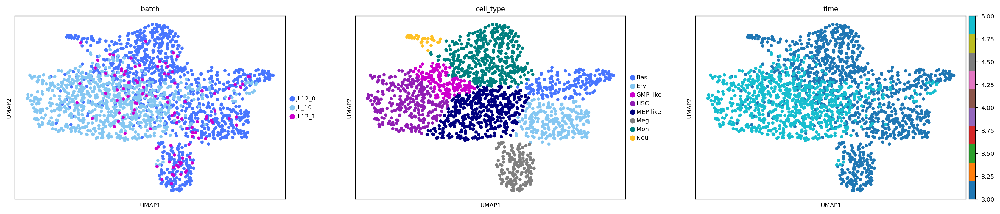

In [168]:
sc.pl.umap(alldata,color=['batch', 'cell_type', 'time'])

In [75]:
for cell_type in set(alldata.obs['cell_type']):
    print(cell_type, np.sum(alldata.obs['cell_type'] == cell_type))

Ery 234
HSC 309
Meg 154
MEP-like 457
GMP-like 161
Neu 32
Mon 423
Bas 177


In [76]:
fitted_idx = alldata.var_names.isin(dynamo_selected_genes)
X=np.zeros((alldata.n_obs,fitted_idx.sum(),2))
X[:,:,0]=alldata.layers["unspliced"][:,fitted_idx].toarray()
X[:,:,1]=alldata.layers["spliced"][:,fitted_idx].toarray()
X.shape

(1947, 1754, 2)

In [77]:
rd = alldata.layers["spliced"].toarray().mean(1)/alldata.layers["spliced"].toarray().mean()
rd.shape

(1947,)

In [55]:
PM = PoissonMixture(n_components=3,verbose=0)
Q, elbo = PM.fit(X,warm_start=False,read_depth=rd,epoch=10,n_init=5)
print(PM.weights)

[0.39806425 0.50691778 0.09501798]


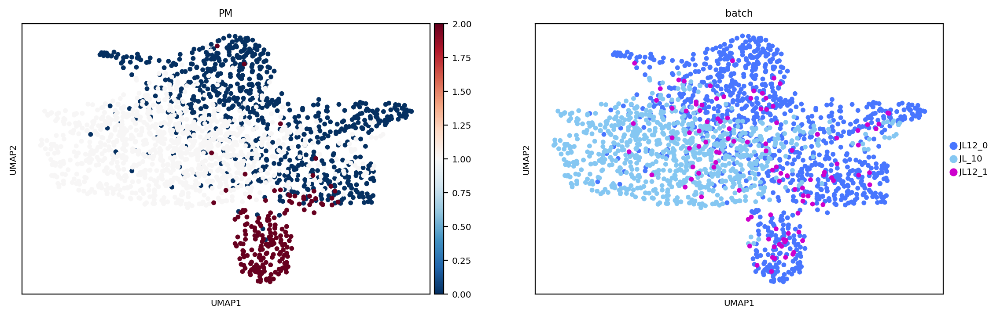

In [56]:
alldata.obs['PM'] = np.argmax(Q,axis=1)
sc.pl.umap(alldata,color=['PM','batch'])

## Subset cells

In [86]:
adata = alldata[alldata.obs['cell_type'].isin(['HSC','MEP-like','Ery','Meg'])]

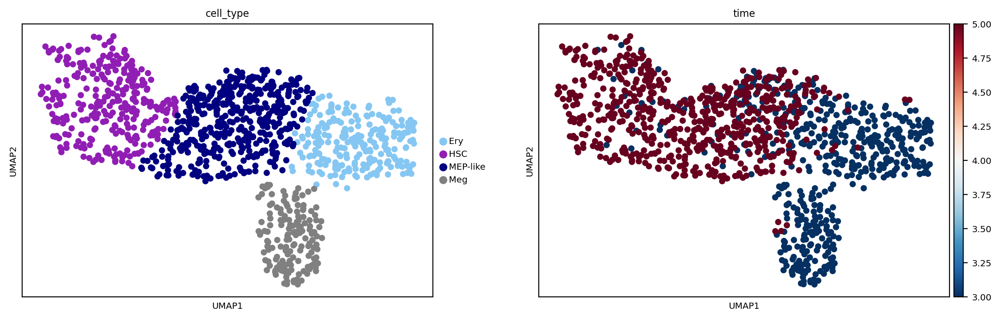

In [79]:
sc.pl.umap(adata,color=['cell_type','time'])

In [87]:
adata.var_names
adata.var['ensembl_id'] = adata.var_names.copy()
adata.var

,gene_name_mapping,ensembl_id
gene_id,,
ENSG00000000003,None,ENSG00000000003
ENSG00000000005,None,ENSG00000000005
ENSG00000000419,None,ENSG00000000419
ENSG00000000457,None,ENSG00000000457
ENSG00000000460,None,ENSG00000000460
...,...,...
ENSG00000288691,None,ENSG00000288691
ENSG00000288692,None,ENSG00000288692
ENSG00000288694,None,ENSG00000288694


In [113]:
'ENSG00000174059' in adata_hsc_raw.var['query'].tolist()

True

In [116]:
query = np.array(adata_hsc_raw.var['query'].tolist())
np.where(query=='ENSG00000174059')[0][0]

11884

**Define marker genes and load gene length data**

In [117]:
gene_names = []
query = np.array(adata_hsc_raw.var['query'].tolist())
for ID in adata.var['ensembl_id']:
    if ID in query:
        gene_names.append( (adata_hsc_raw.var_names[np.where(query==ID)[0][0]]).upper() )
    else:
        gene_names.append('NaN')
adata.var['id'] = adata.var_names.copy()
adata.var_names = gene_names

In [128]:
adata.var_names[adata.var['ensembl_id'].isin(marker_genes_id)]

Index(['ITGA2B', 'PTPRC', 'CD36', 'CD34'], dtype='object')

In [247]:
for name in adata.var_names: 
    if name.startswith("HB"):
        print(name)

HBP1
HBS1L
HBEGF
HBZ
HBA2
HBG2
HBA1
HBM
HBG1
HBD
HBBP1
HBB


In [251]:
marker_genes = ['CD34', 'CD38','ITGA2B', 'PTPRC','HBB'] # CD41, CD45
marker_genes_id = ['ENSG00000174059','ENSG00000135218','ENSG00000005961','ENSG00000081237']

In [260]:
plot_marker_genes = marker_genes

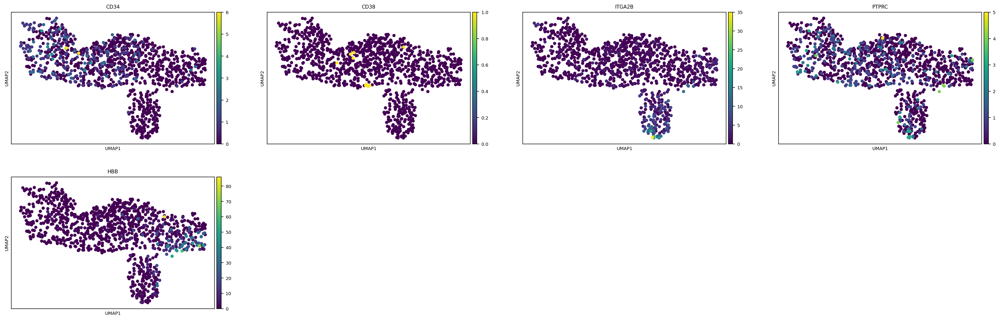

In [257]:
sc.pl.umap(adata,color=marker_genes)

In [136]:
gene_length_file = np.loadtxt("data/gg_200524_mouse_genome_polyA_cum_1.txt",dtype="str")
gene_length = np.array([int(gene[1]) for gene in gene_length_file])
gene_name = np.array([gene[0].upper() for gene in gene_length_file])
print(np.sum(adata.var_names.isin(gene_name)))

13776


**PCA plots and marker gene expresssion**

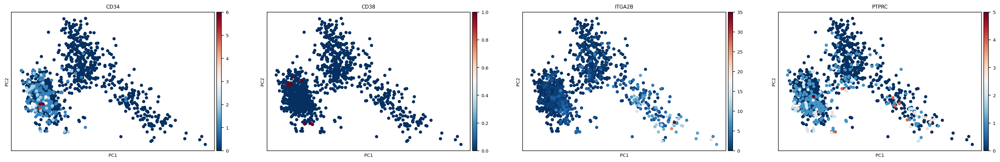

In [139]:
from sklearn.decomposition import PCA

total_UMI = adata.X.toarray().sum(axis=1)
r = total_UMI/np.mean(total_UMI)
pca = PCA(n_components=2)
x = pca.fit_transform(np.log(1+adata.X.toarray()/total_UMI[:,None]*np.mean(total_UMI)))

adata.obsm['X_pca'] = x
sc.pl.pca(adata,color=marker_genes)

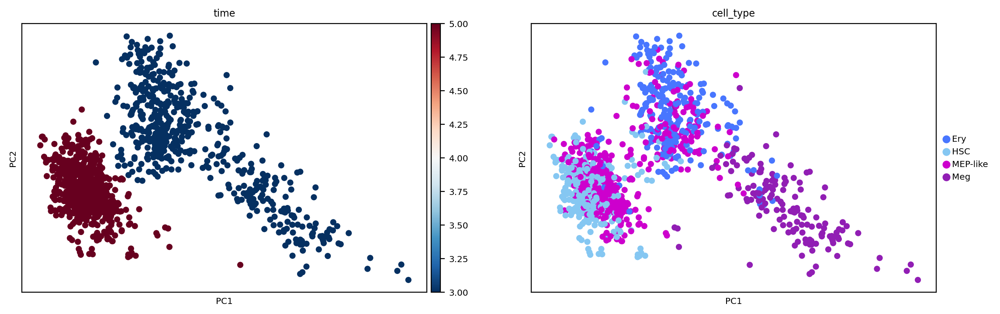

In [141]:
sc.pl.pca(adata,color=['time','cell_type'])

In [142]:
x = adata.obsm['X_umap']

**Define clusters and cell colors**

In [143]:
clusters = adata.obs['cell_type']
set(clusters)

{'Ery', 'HSC', 'MEP-like', 'Meg'}

In [144]:
Clusters = ['HSC','MEP-like','Ery','Meg']

In [145]:
color_palette = ["#f7f7f7","#dfe3ee","#8b9dc3","#3b5998"]
from matplotlib.colors import LinearSegmentedColormap
cmap_cluster = LinearSegmentedColormap.from_list("my_cmap", color_palette, N=len(Clusters))

cell_colors = np.zeros((adata.n_obs,3))

for i,Cluster in enumerate(Clusters):
    idx = clusters.isin([Cluster])
    cell_colors[idx] = cmap_cluster(i)[:3]

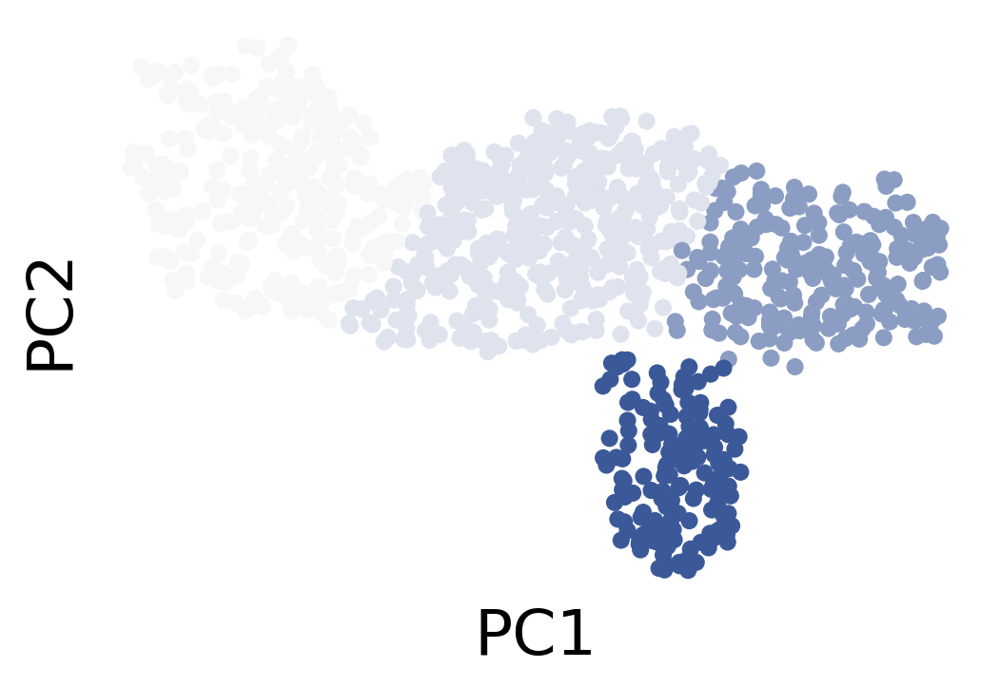

In [146]:
fig, ax = plt.subplots(1,1)
ax.scatter(x[:,0],x[:,1],c=cell_colors);
ax.set_xlabel('PC1',fontsize=24)
ax.set_ylabel('PC2',fontsize=24)
ax.set_frame_on(False)
plt.xticks([]);
plt.yticks([]);

# Select genes

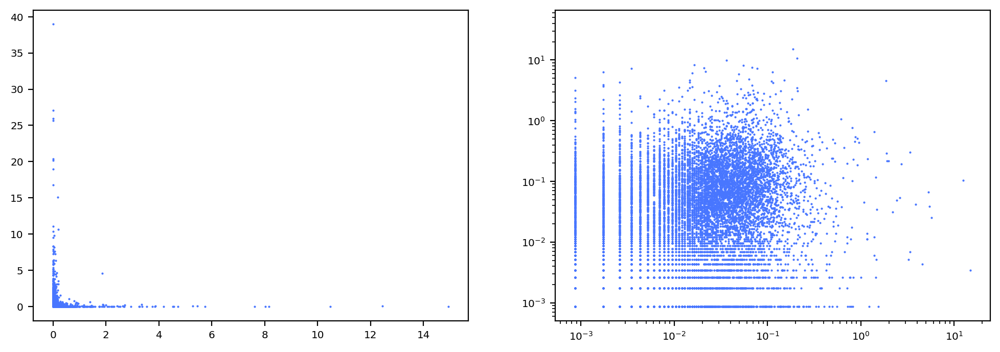

In [298]:
fig, ax = plt.subplots(1,2,figsize=(12,4))
ax[0].scatter(adata.layers['unspliced'].toarray().mean(0),adata.layers['spliced'].toarray().mean(0),s=1)
ax[1].scatter(adata.layers['unspliced'].toarray().mean(0),adata.layers['spliced'].toarray().mean(0),s=1)
ax[1].set_xscale('log')
ax[1].set_yscale('log')

In [299]:
idx = (adata.layers["unspliced"].toarray().mean(0) > 0) 
U = adata.layers["unspliced"][:,idx].toarray()
n,p = U.shape
X = U
X_cov = np.cov(X,rowvar=False)
X_mean = np.mean(X,axis=0)
X_rho = X_cov/X_mean[:,None]/X_mean[None,:]
su = (np.sum(X_rho)-np.sum(np.diag(X_rho)))/((p-1)*p)
print("s estimated by normalized covariance of total U counts =", str(su))


idx = adata.layers["spliced"].toarray().mean(0) > 0
S = adata.layers["spliced"][:,idx].toarray()
n,p = S.shape
X = S
X_cov = np.cov(X,rowvar=False)
X_mean = np.mean(X,axis=0)
X_rho = X_cov/X_mean[:,None]/X_mean[None,:]
ss = (np.sum(X_rho)-np.sum(np.diag(X_rho)))/((p-1)*p)
print("s estimated by normalized covariance of total S counts =", str(ss))

idx = (adata.layers["spliced"].toarray().mean(0) > 0) | (adata.layers["unspliced"].toarray().mean(0) > 0)
U=adata.layers["unspliced"][:,idx].toarray()
S=adata.layers["spliced"][:,idx].toarray()
X = S + U
n,p = X.shape
X_cov = np.cov(X,rowvar=False)
X_mean = np.mean(X,axis=0)
X_rho = X_cov/X_mean[:,None]/X_mean[None,:]
s1 = (np.sum(X_rho)-np.sum(np.diag(X_rho)))/((p-1)*p)
print("s estimated by normalized covariance of total counts =", str(s1))

X = U + S
X_total = X.sum(1)
s2 = (X_total.var()-X_total.mean())/X_total.mean()**2
print("s estimated by total counts =", str(s2))

s estimated by normalized covariance of total U counts = 0.6220511535879203
s estimated by normalized covariance of total S counts = 0.4982287543826163
s estimated by normalized covariance of total counts = 0.5384989202356458
s estimated by total counts = 0.4802751867767683


s estimated by normalized covariance of Poission genes = 0.5376579143823929


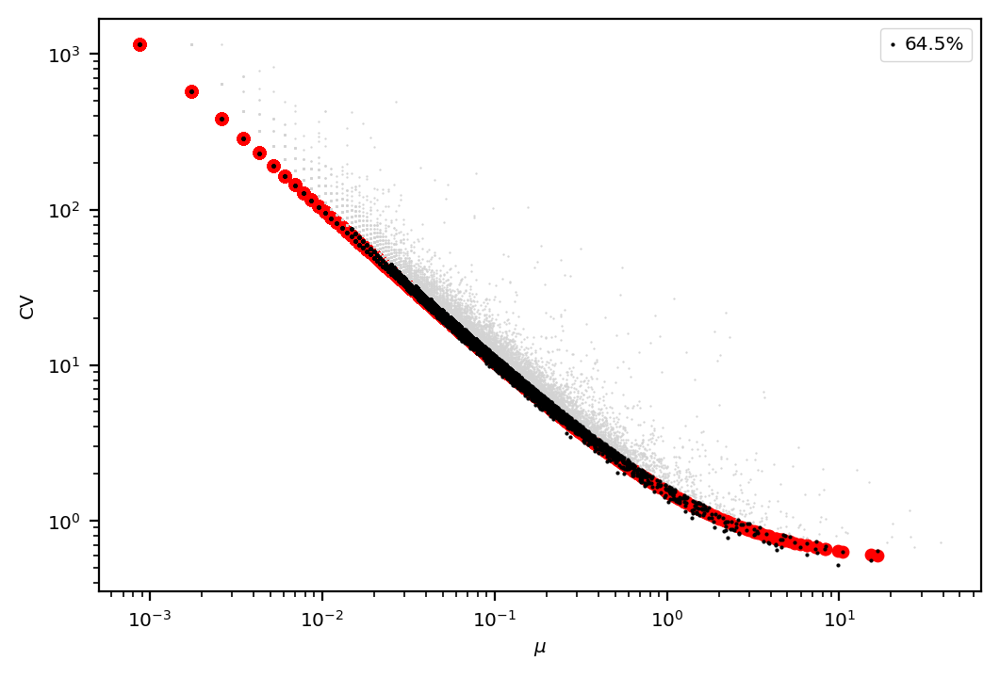

In [300]:
a=1
s=s1

X_bar = np.mean(U + S, axis=0)
X_var = np.var(U + S, axis=0)

Pgene_mask = (X_mean > 0) & (X_var/(a*X_mean + s*X_mean**2) < 1.1)
Pgenes = adata.var_names[idx][Pgene_mask]

P = (S + U)[:,Pgene_mask]
n,p = P.shape
P_cov = np.cov(P,rowvar=False)
P_mean = np.mean(P,axis=0)
P_rho = P_cov/P_mean[:,None]/P_mean[None,:]
s = (np.sum(P_rho)-np.sum(np.diag(P_rho)))/((p-1)*p)
print("s estimated by normalized covariance of Poission genes =", str(s))

plt.scatter(X_bar[Pgene_mask], a/X_bar[Pgene_mask] + s, c='r', s=20)
plt.scatter(X_bar, X_var/X_bar**2,c='lightgray',alpha=1, s=0.1)
plt.scatter(X_bar[Pgene_mask], X_var[Pgene_mask]/X_bar[Pgene_mask]**2,c='k', s=1, label=str(np.around(100*np.sum(Pgene_mask)/len(X_bar),1))+"%")
plt.xlabel(r'$\mu$')
plt.ylabel(r'CV')
plt.xscale('log')
plt.yscale('log')
plt.legend(loc="upper right")

s estimated by normalized covariance of Poission genes = 0.5377514693949298


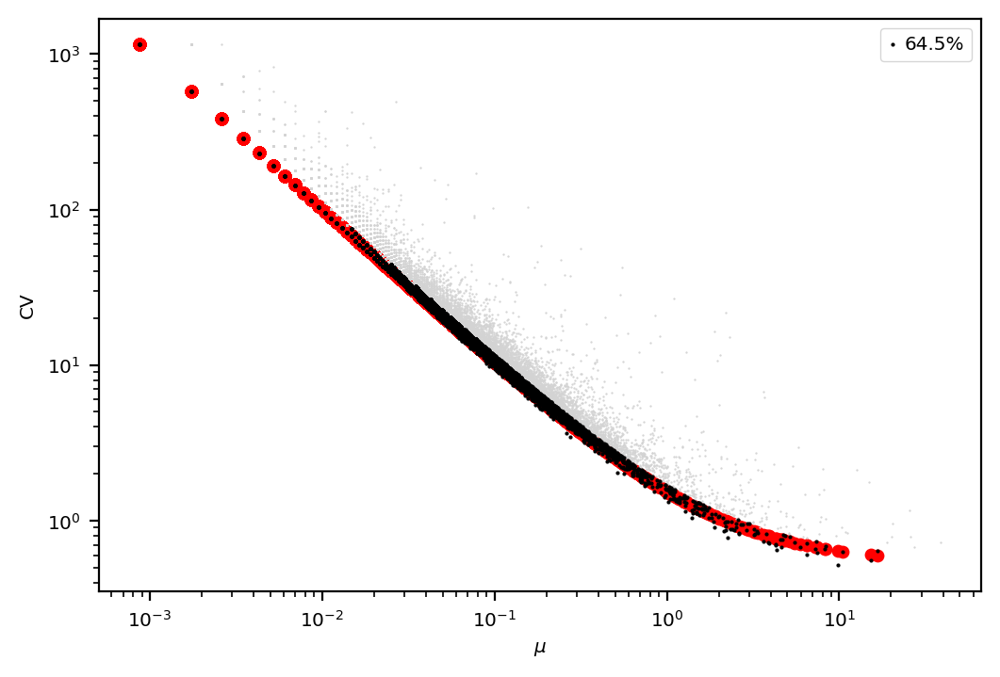

In [301]:
Pgene_mask = (X_mean > 0) & (X_var/(a*X_mean + s*X_mean**2) < 1.1)
Pgenes = adata.var_names[idx][Pgene_mask]

P = (S + U)[:,Pgene_mask]
n,p = P.shape
P_cov = np.cov(P,rowvar=False)
P_mean = np.mean(P,axis=0)
P_rho = P_cov/P_mean[:,None]/P_mean[None,:]
s = (np.sum(P_rho)-np.sum(np.diag(P_rho)))/((p-1)*p)
print("s estimated by normalized covariance of Poission genes =", str(s))

plt.scatter(X_bar[Pgene_mask], a/X_bar[Pgene_mask] + s, c='r', s=20)
plt.scatter(X_bar, X_var/X_bar**2,c='lightgray',alpha=1, s=0.1)
plt.scatter(X_bar[Pgene_mask], X_var[Pgene_mask]/X_bar[Pgene_mask]**2,c='k', s=1, label=str(np.around(100*np.sum(Pgene_mask)/len(X_bar),1))+"%")
plt.xlabel(r'$\mu$')
plt.ylabel(r'CV')
plt.xscale('log')
plt.yscale('log')
plt.legend(loc="upper right")

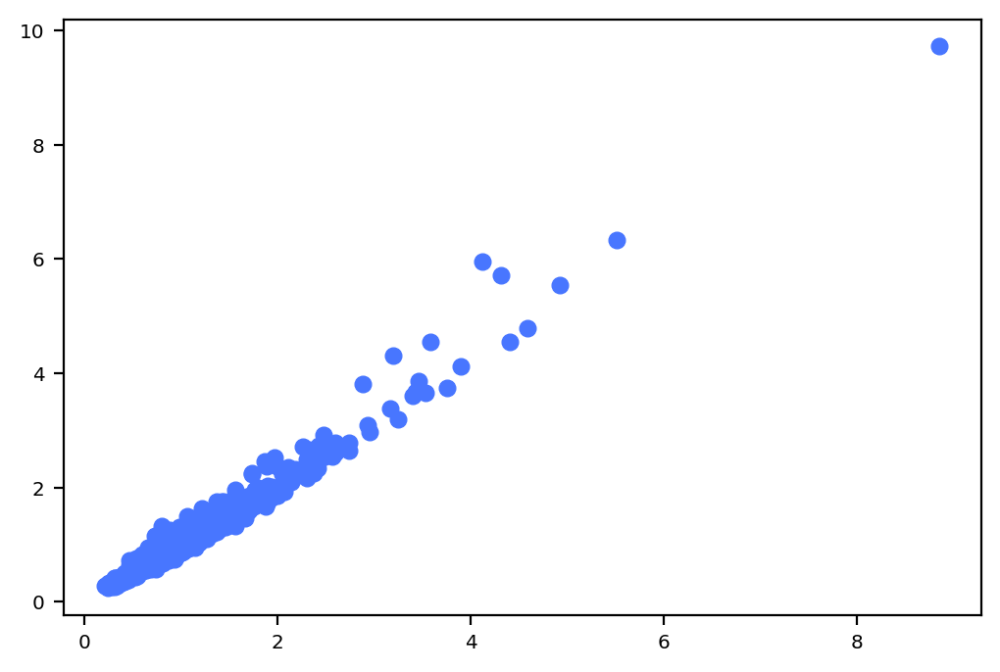

In [302]:
read_depth =  (U + S)[:,Pgene_mask].sum(1)
rd = read_depth/read_depth.mean()

XX = U + S
plt.figure()
plt.scatter(rd,XX.mean(1)/XX.mean())

In [303]:
var_threshold = 1.3
U_mean = adata.layers["unspliced"].toarray().mean(0)
S_mean = adata.layers["spliced"].toarray().mean(0)
U_var = adata.layers["unspliced"].toarray().var(0)
S_var = adata.layers["spliced"].toarray().var(0)
fitted_idx = (U_mean > 0.01) & (S_mean > 0.01) \
    & (U_var/(a*U_mean + s*U_mean**2) > var_threshold) \
    & (S_var/(a*S_mean + s*S_mean**2) > var_threshold) \
    & (np.abs(np.log(S_mean/U_mean)) < 4)
fitted_genes=adata.var_names[fitted_idx]
len(fitted_genes)

191

In [304]:
cell_cycle_genes = np.loadtxt("data/cell_cycle_genes.txt",dtype="str")
cell_cycle_genes = [gene.upper() for gene in cell_cycle_genes]
fitted_genes = fitted_genes[~fitted_genes.isin(cell_cycle_genes)]
len(fitted_genes)

170

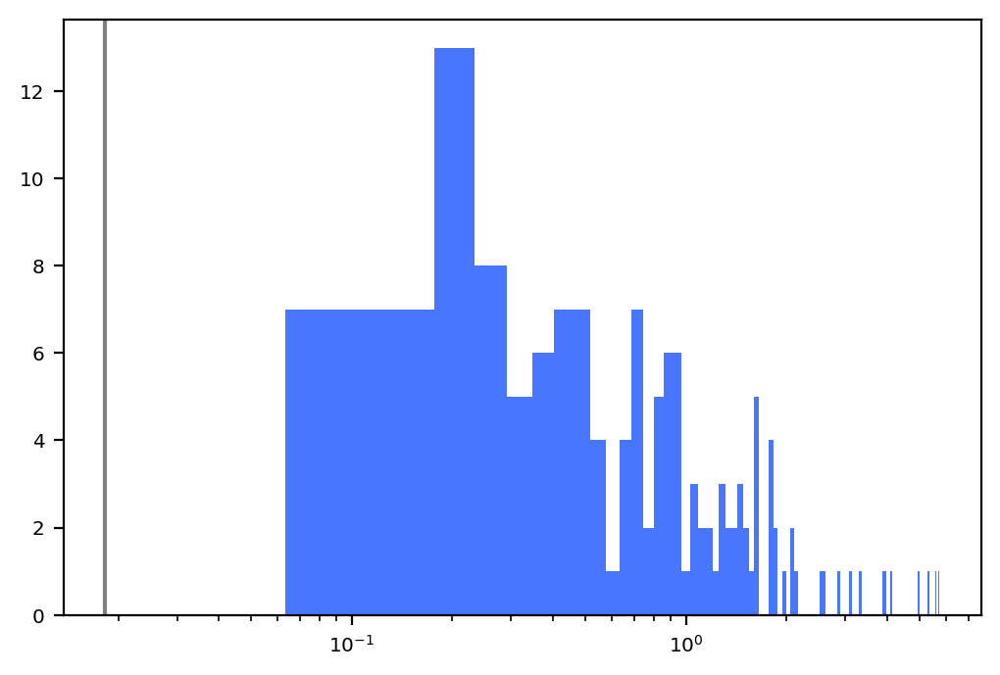

In [305]:
fitted_genes = fitted_genes[fitted_genes.isin(gene_name)]
fitted_idx = adata.var_names.isin(fitted_genes)

Ub_gene_idx = np.array([ np.where(gene_name == fitted_gene)[0][0]  for fitted_gene in fitted_genes ],dtype=int)
Ub = 10**(-5)*gene_length[Ub_gene_idx]
plt.hist(Ub,bins=100);
plt.xscale('log')
plt.axvline(x=np.e**(-4),color='gray');

(1154, 144, 2)

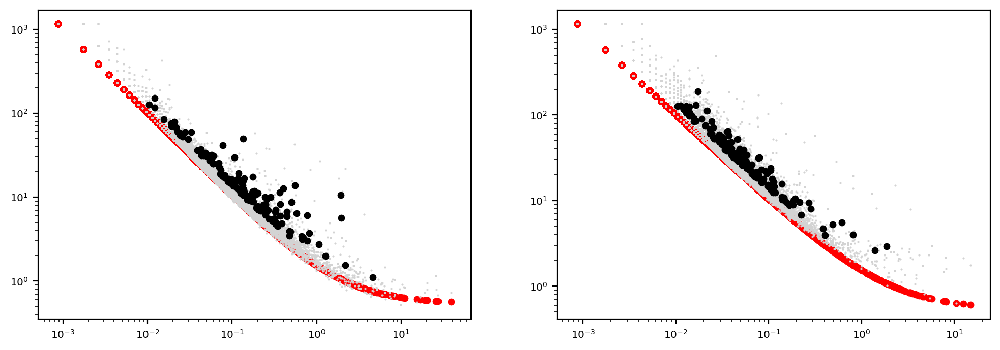

In [306]:
fig, ax = plt.subplots(1,2,figsize=(12,4))
ax[0].scatter(S_mean, a/S_mean + s, c='r', s=20)
ax[0].scatter(S_mean, S_var/S_mean**2,c='lightgray',alpha=1, s=1)
ax[0].scatter(S_mean[fitted_idx], S_var[fitted_idx]/S_mean[fitted_idx]**2, c='k', s=20)
ax[0].set_xscale('log')
ax[0].set_yscale('log')
ax[1].scatter(U_mean, a/U_mean + s, c='r', s=20)
ax[1].scatter(U_mean, U_var/U_mean**2,c='lightgray',alpha=1, s=1)
ax[1].scatter(U_mean[fitted_idx], U_var[fitted_idx]/U_mean[fitted_idx]**2, c='k', s=20)
ax[1].set_xscale('log')
ax[1].set_yscale('log')

X=np.zeros((n,fitted_idx.sum(),2))
X[:,:,0]=adata.layers["unspliced"][:,fitted_idx].toarray()
X[:,:,1]=adata.layers["spliced"][:,fitted_idx].toarray()
fitted_genes=adata.var_names[fitted_idx]
X.shape

In [307]:
plot_idx = [np.where(fitted_genes==gene)[0] for gene in marker_genes]
plot_idx = np.concatenate(plot_idx).ravel()
if plot_idx.sum() == 0:
    plot_idx = np.arange(10)
else:
    print(fitted_genes[plot_idx])

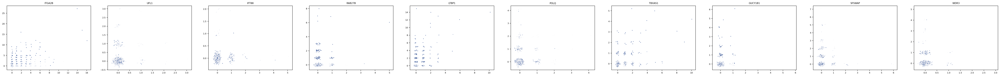

In [308]:
pp = min(10,len(plot_idx))
fix, ax = plt.subplots(1,pp,figsize=(6*pp,4))
for i in range(pp):
    j = plot_idx[i]
    ax[i].set_title(fitted_genes[j])
    ax[i].scatter(X[:,j,0]+np.random.normal(0,0.1,X.shape[0]),X[:,j,1]+np.random.normal(0,0.1,X.shape[0]),s=2,alpha=1,c=cell_colors)

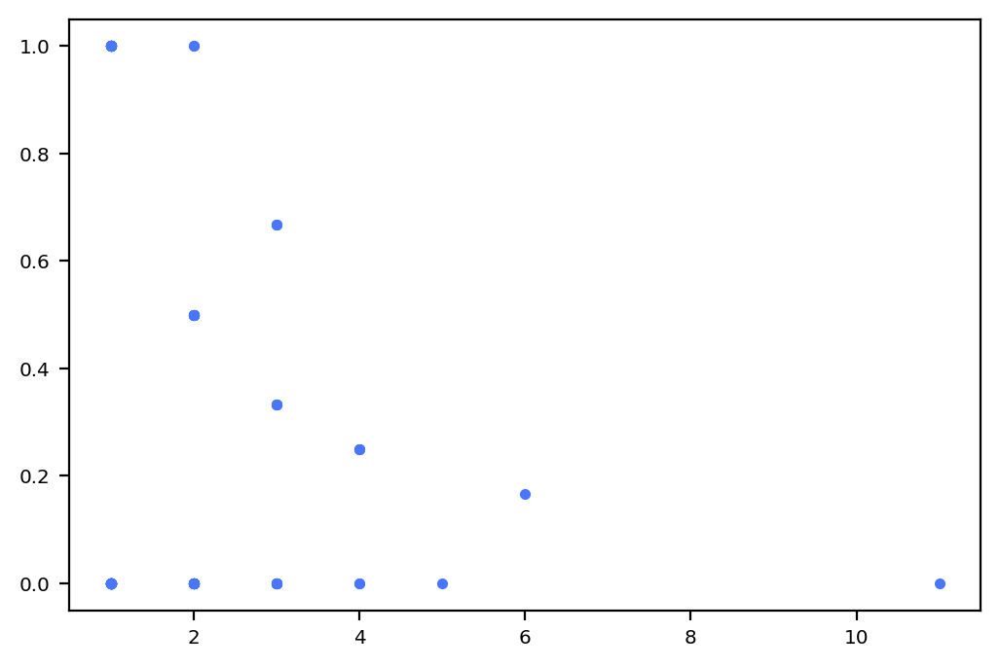

In [319]:
j = np.arange(adata.n_vars)[fitted_idx][100]
plt.plot(adata.layers['total'].toarray()[:,j],adata.layers['new'].toarray()[:,j]/adata.layers['total'].toarray()[:,j],'.')

# Mixtures fitting

In [158]:
cell_idx = np.arange(adata.n_obs)
X_mix = X[cell_idx]

In [159]:
PMs = []
for nc in range(1,8):
    PM = PoissonMixture(n_components=nc,verbose=0)
    Q, elbo = PM.fit(X_mix,warm_start=False,read_depth=rd,epoch=5,n_init=3)
    PMs.append(PM)
    print(nc,PM.compute_AIC(X_mix),PM.compute_BIC(X_mix))

1 -120.38490781216765 -121.01518725790231
2 -106.938343344912 -108.20109070667901
3 -105.2951206693575 -107.19033594715687
4 -104.43817929768444 -106.96586249151615
5 -103.59424540995907 -106.75439651982313
6 -103.0990885770714 -106.89170760296781
7 -102.55996661116139 -106.98505355309014


([<matplotlib.patches.Wedge at 0x7f75bd41cfd0>,
 [Text(-0.07938932442536623, 1.0971314119864055, ''),
  Text(-0.3774705931482117, -1.0332066353389031, ''),
  Text(1.0032693600869713, -0.4510549757077059, '')])

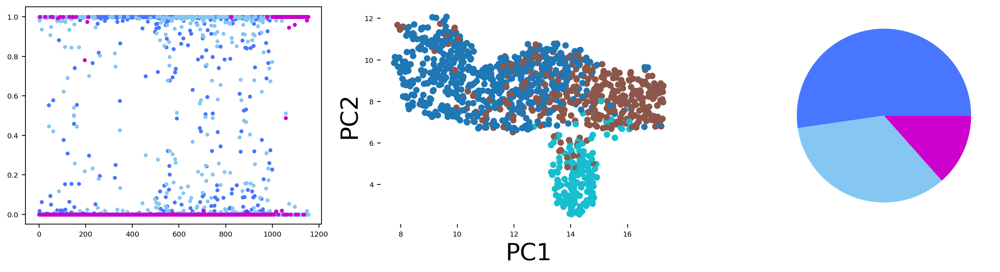

In [169]:
PM = PoissonMixture(n_components=3,verbose=0)
Q, elbo = PM.fit(X_mix,warm_start=False,read_depth=rd,epoch=10,n_init=5)

tab_colors = plt.cm.tab10(np.arange(10))
fig, ax = plt.subplots(1,3,figsize=(18,4))
ax[0].plot(Q[np.argsort(clusters[cell_idx])],'.');
ax[1].scatter(x[cell_idx,0],x[cell_idx,1],c=np.argmax(Q,axis=1));#,c=tab_colors[np.argmax(Q,axis=1)]
ax[1].set_xlabel('PC1',fontsize=24)
ax[1].set_ylabel('PC2',fontsize=24)
ax[1].set_frame_on(False)
ax[2].pie(PM.weights)

([<matplotlib.patches.Wedge at 0x7f75bd91c250>,
 [Text(0.652273183790855, 0.885742453373068, ''),
  Text(-0.7197831398337827, 0.8318126180883657, ''),
  Text(-0.7895304185316879, -0.7659253999007852, ''),
  Text(0.9214052147610013, -0.6008430994953949, '')])

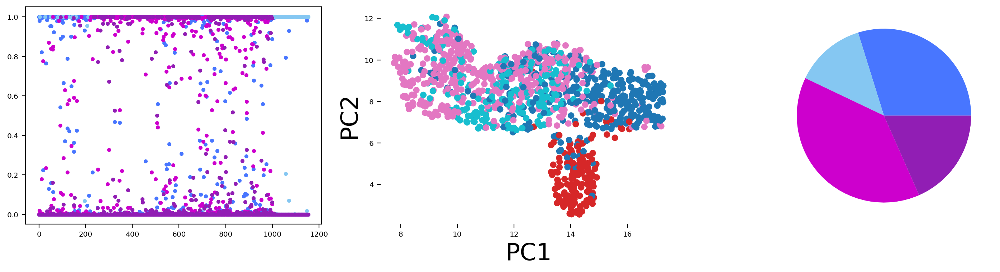

In [170]:
PM = PoissonMixture(n_components=4,verbose=0)
Q, elbo = PM.fit(X_mix,warm_start=False,read_depth=rd,epoch=10,n_init=5)

tab_colors = plt.cm.tab10(np.arange(10))
fig, ax = plt.subplots(1,3,figsize=(18,4))
ax[0].plot(Q[np.argsort(clusters[cell_idx])],'.');
ax[1].scatter(x[cell_idx,0],x[cell_idx,1],c=np.argmax(Q,axis=1));#,c=tab_colors[np.argmax(Q,axis=1)]
ax[1].set_xlabel('PC1',fontsize=24)
ax[1].set_ylabel('PC2',fontsize=24)
ax[1].set_frame_on(False)
ax[2].pie(PM.weights)

[0.24147563 0.30975649 0.13186322 0.25004679 0.06685788]


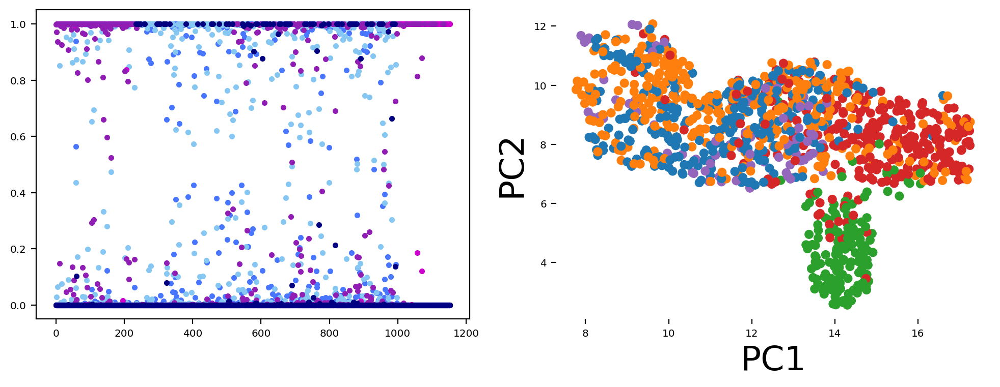

In [171]:
PM = PoissonMixture(n_components=5,verbose=0)
Q, elbo = PM.fit(X_mix,warm_start=False,read_depth=rd,epoch=10,n_init=5)
print(PM.weights)

tab_colors = plt.cm.tab10(np.arange(10))
fig, ax = plt.subplots(1,2,figsize=(12,4))
ax[0].plot(Q[np.argsort(clusters[cell_idx])],'.');
ax[1].scatter(x[cell_idx,0],x[cell_idx,1],c=tab_colors[np.argmax(Q,axis=1)]);
ax[1].set_xlabel('PC1',fontsize=24)
ax[1].set_ylabel('PC2',fontsize=24)
ax[1].set_frame_on(False)

# Trajectory fitting

In [216]:
elbos = {}
traj_params={'r':rd,'Ub':Ub,"lambda_tau":0,"lambda_a":0}

## Fine cluster

In [264]:
Cluster_prior = [['HSC'],['MEP-like'],['Ery','Meg']]
m=100
weight0 = 100*np.ones((adata.n_obs,2,m))
for i,Cluster in enumerate(Cluster_prior):
    idx = clusters.isin(Cluster)
    weight0[idx,:,int(i*m/len(Clusters)):int((i+1)*m/len(Clusters))] += 0.1

i=2
idx = clusters.isin(['Ery'])
weight0[idx,0,int(i*m/len(Clusters)):int((i+1)*m/len(Clusters))] += 0.1
idx = clusters.isin(['Meg'])
weight0[idx,1,int(i*m/len(Clusters)):int((i+1)*m/len(Clusters))] += 0.1

weight0 = weight0/weight0.sum(axis=(1,2),keepdims=True)
#plt.scatter(np.sum(t_grids[None,:]*weight0,axis=1),s,c=colors20[np.mod(clusters, 20)]);
Q0 = weight0

[0.         0.72244355 2.        ]


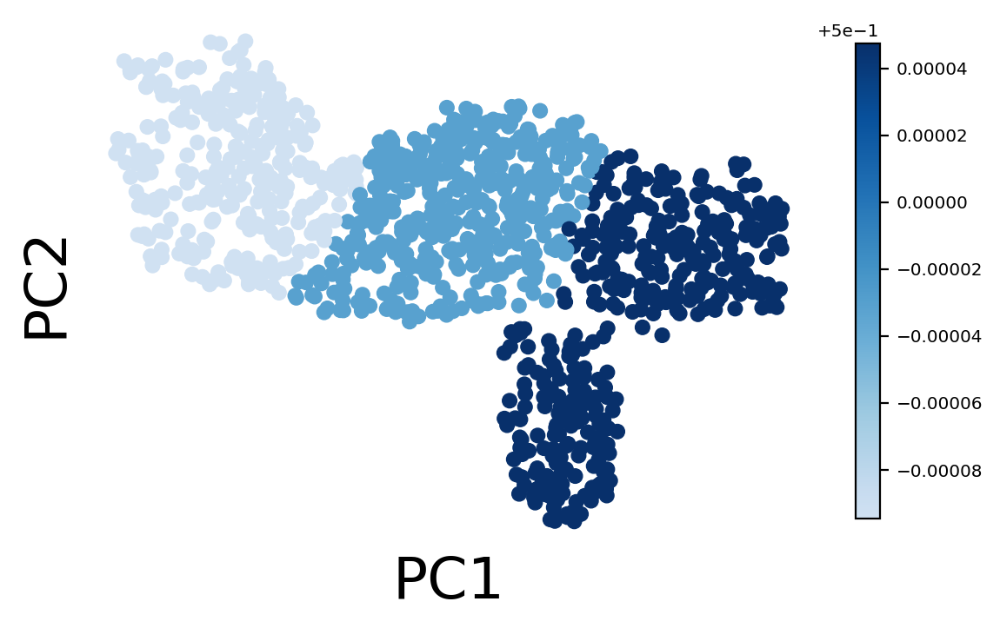

In [265]:
cmap_y = cmr.get_sub_cmap('Blues', 0.2, 1)
fig, ax = plt.subplots(1,1)
im=ax.scatter(x[:,0],x[:,1],c=(weight0.sum(1))@(np.linspace(0,1,m).reshape((-1,1))),cmap=cmap_y);
ax.set_xlabel('PC1',fontsize=24)
ax.set_ylabel('PC2',fontsize=24)
ax.set_frame_on(False)
plt.xticks([]);
plt.yticks([]);
plt.colorbar(im,fraction=0.05, shrink =0.9) # adding the colobar on the right
print(traj.tau)

In [266]:
topo = np.array([[0,1,2],[0,1,3]])
tau = (0,1,2) # ~2 hours
traj = Trajectory(topo, tau, model="two_species_ss",verbose=1)
traj = traj.fit(X,warm_start=True,fit_tau=True,params=traj_params,Q=Q0,parallel=True,n_threads=4,epoch=100)
print(traj.elbos[-1])

fitting with warm start


100%|██████████| 100/100 [02:12<00:00,  1.32s/it]

-104.87914491682471


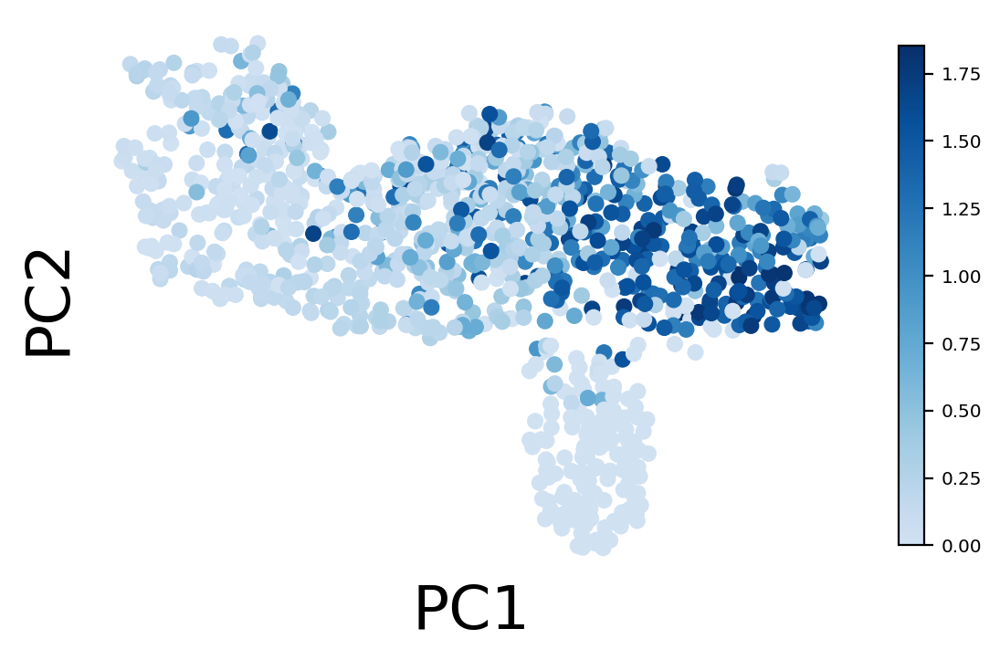

In [267]:
cmap_y = cmr.get_sub_cmap('Blues', 0.2, 1)
fig, ax = plt.subplots(1,1)
im=ax.scatter(x[:,0],x[:,1],c=traj.Q[:,0]@traj.t,cmap=cmap_y);
ax.set_xlabel('PC1',fontsize=24)
ax.set_ylabel('PC2',fontsize=24)
ax.set_frame_on(False)
plt.xticks([]);
plt.yticks([]);
plt.colorbar(im,fraction=0.05, shrink =0.9) # adding the colobar on the right

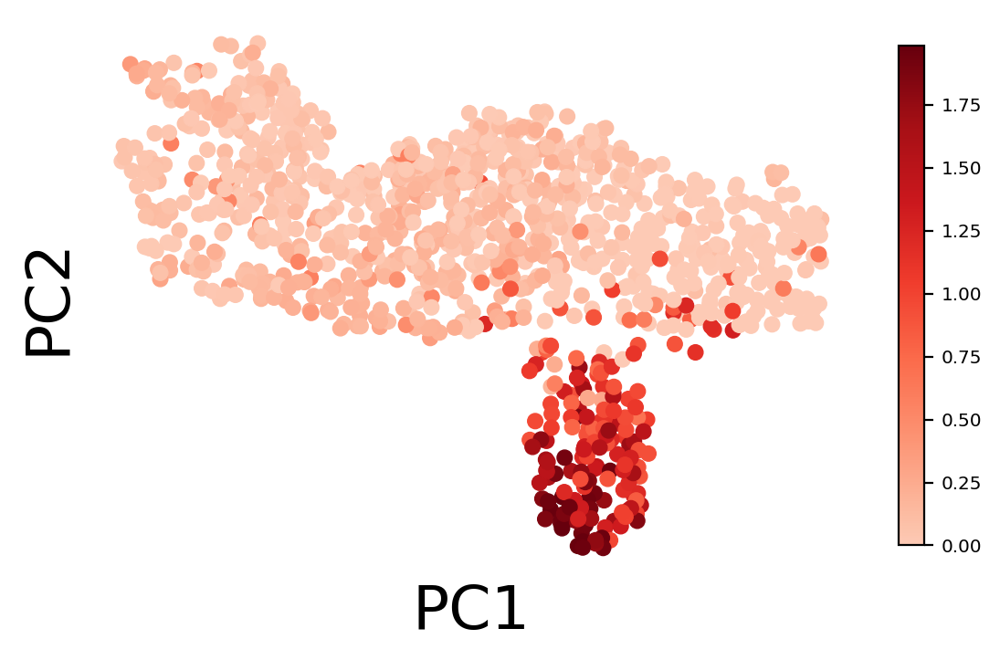

In [268]:
cmap_y = cmr.get_sub_cmap('Reds', 0.2, 1)
fig, ax = plt.subplots(1,1)
im=ax.scatter(x[:,0],x[:,1],c=traj.Q[:,1]@traj.t,cmap=cmap_y);
ax.set_xlabel('PC1',fontsize=24)
ax.set_ylabel('PC2',fontsize=24)
ax.set_frame_on(False)
plt.xticks([]);
plt.yticks([]);
plt.colorbar(im,fraction=0.05, shrink =0.9) # adding the colobar on the right

[]

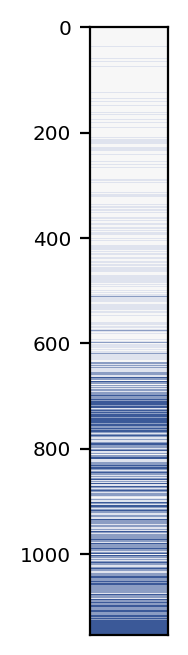

In [269]:
order = np.argsort((traj.Q@traj.t).sum((1)))
cluster = np.zeros(adata.n_obs)
for i,Cluster in enumerate(Clusters):
    idx = clusters.isin([Cluster])
    cluster[idx] = i
#plt.scatter(np.sum(t_grids[None,:]*weight0,axis=1),s,c=colors20[np.mod(clusters, 20)]);
fig, ax = plt.subplots(1,1,figsize=(0.5,4))
ax.imshow(cluster[order,None],aspect="auto",cmap=cmap_cluster)
ax.set_xticks([])

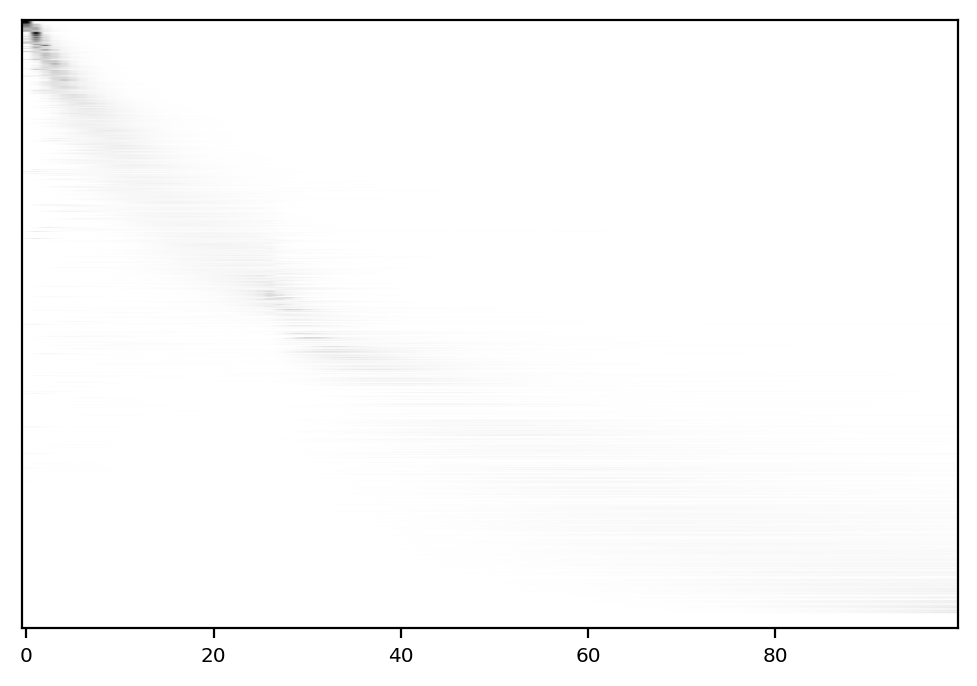

In [270]:
fig, ax = plt.subplots(1,1,figsize=(6,4))
ax=plot_t(traj,l=0,ax=ax,order_cells=True)
ax.set_yticks([]);

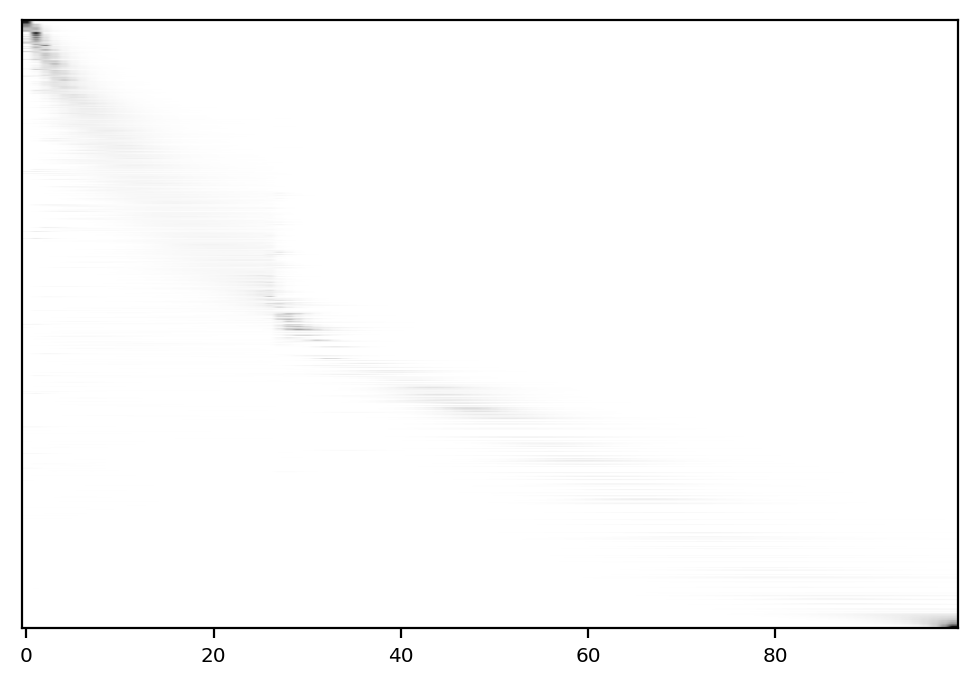

In [271]:
fig, ax = plt.subplots(1,1,figsize=(6,4))
ax=plot_t(traj,l=1,ax=ax,order_cells=True)
ax.set_yticks([]);

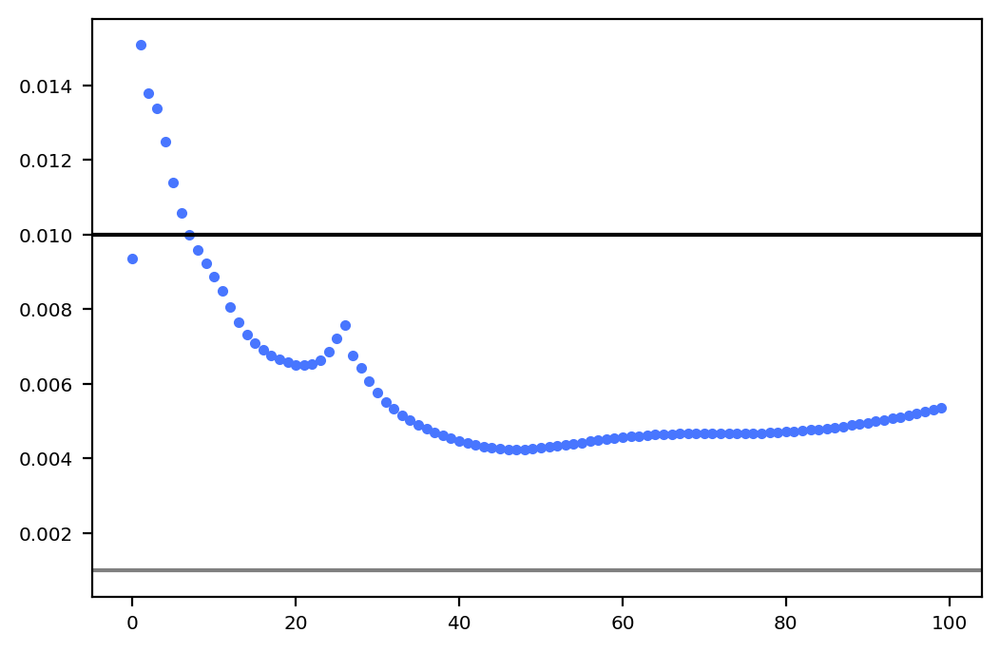

In [272]:
plt.plot(traj.Q[:,0].mean(0),'.')
plt.axhline(y=1/traj.m,c='k')
plt.axhline(y=0.1/traj.m,c='gray')

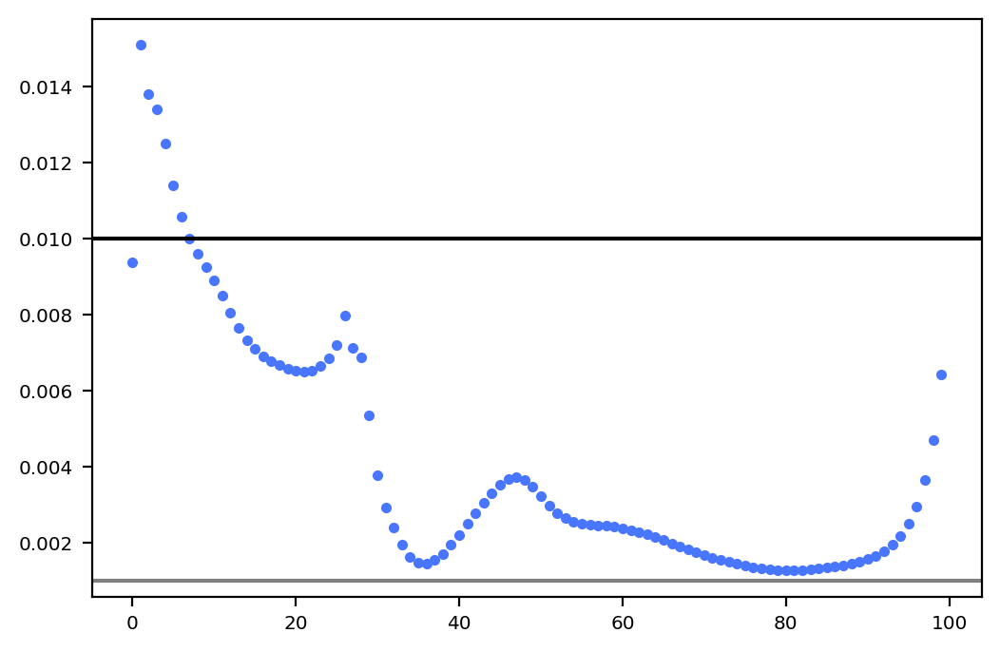

In [273]:
plt.plot(traj.Q[:,1].mean(0),'.')
plt.axhline(y=1/traj.m,c='k')
plt.axhline(y=0.1/traj.m,c='gray')

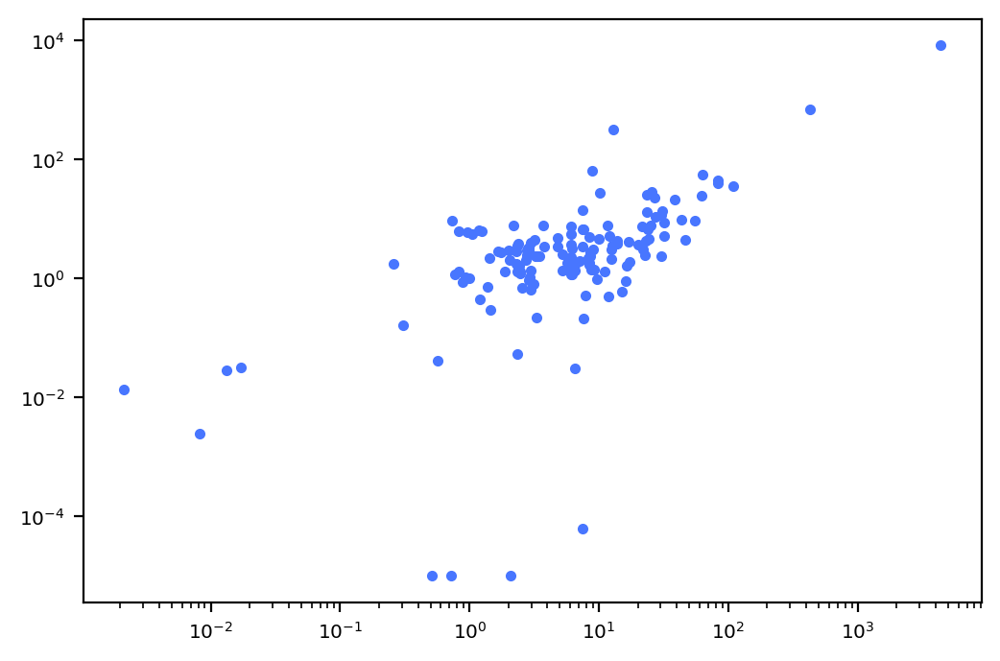

In [274]:
plt.loglog(traj.theta[:,[-2]],traj.theta[:,[-1]],'.')

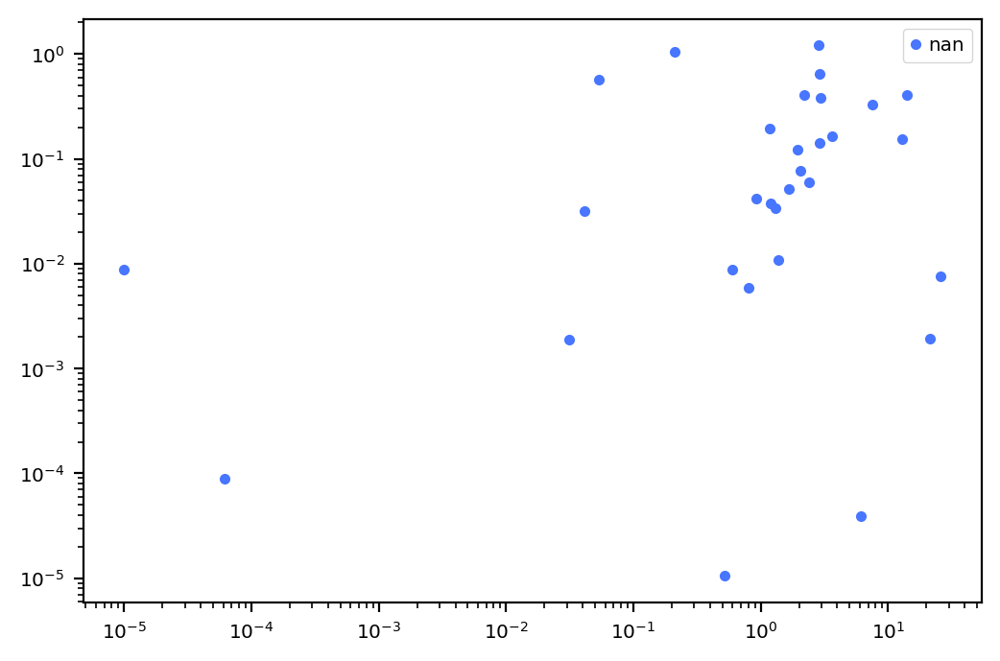

In [291]:
common_idx = fitted_genes.isin( adata_hsc_raw.var_names[adata_hsc_raw.var['use_for_dynamics']])
gamma_5 = np.array([  adata_hsc_raw.var['time_5_gamma'][adata_hsc_raw.var_names.isin([gene])][0]  for gene in fitted_genes[common_idx]])
gamma_3 = np.array([  adata_hsc_raw.var['time_3_gamma'][adata_hsc_raw.var_names.isin([gene])][0]  for gene in fitted_genes[common_idx]])
plt.loglog(traj.theta[common_idx,-1],gamma,'.',label=np.round(CCC(gamma,traj.theta[common_idx,-1])));
plt.legend()

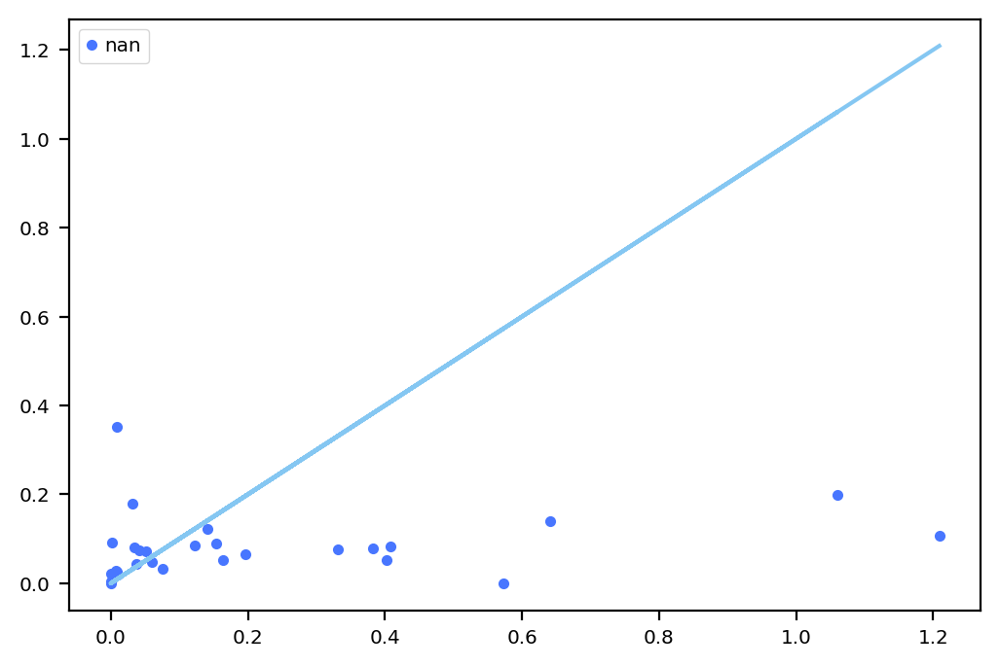

In [295]:
common_idx = fitted_genes.isin( adata_hsc_raw.var_names[adata_hsc_raw.var['use_for_dynamics']])
gamma_5 = np.array([  adata_hsc_raw.var['time_5_gamma'][adata_hsc_raw.var_names.isin([gene])][0]  for gene in fitted_genes[common_idx]])
gamma_3 = np.array([  adata_hsc_raw.var['time_3_gamma'][adata_hsc_raw.var_names.isin([gene])][0]  for gene in fitted_genes[common_idx]])

plt.plot(gamma_3,gamma_5,'.',label=np.round(np.corrcoef(gamma_3,gamma_5)[0,1]));
plt.plot(gamma_3,gamma_3);
plt.legend()

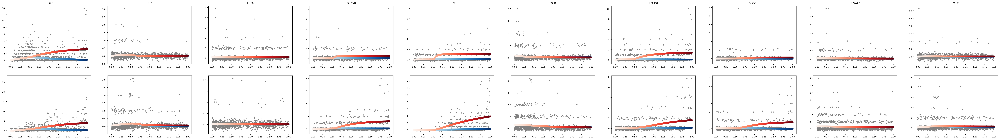

In [275]:
plot_y(traj,X=X,idx=plot_idx,gene_name=fitted_genes);

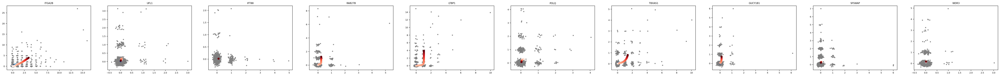

In [276]:
plot_phase(traj,X=X,idx=plot_idx,gene_name=fitted_genes);

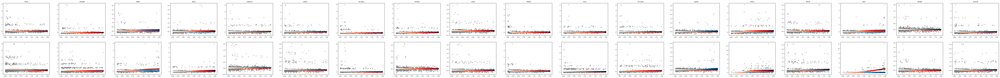

In [277]:
Ery_idx = np.arange(len(fitted_genes))[traj.theta[:,2] > 10*traj.theta[:,1]]
plot_y(traj,X=X,idx=Ery_idx,gene_name=fitted_genes);

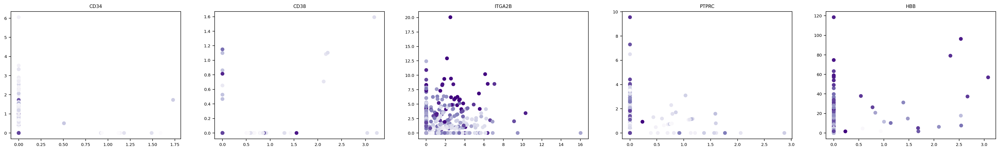

In [278]:
fig,ax = plt.subplots(1,len(plot_marker_genes),figsize=(6*len(plot_marker_genes),4))
for i,gene in enumerate(plot_marker_genes):
    j = np.where(adata.var_names == gene)[0][0]
    ax[i].set_title(gene)
    ax[i].scatter(adata.layers["unspliced"].toarray()[:,j]/rd,adata.layers["spliced"].toarray()[:,j]/rd,cmap='Purples',c=traj.Q.sum(1)@traj.t)

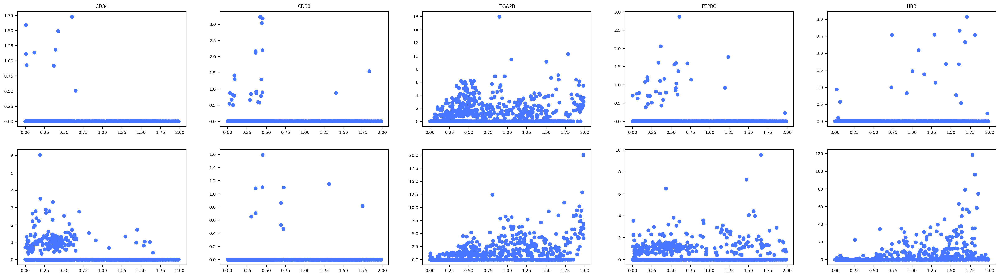

In [279]:
fig,ax = plt.subplots(2,len(plot_marker_genes),figsize=(6*len(plot_marker_genes),8))
for i,gene in enumerate(plot_marker_genes):
    j = np.where(adata.var_names == gene)[0][0]
    ax[0,i].set_title(gene)
    ax[0,i].scatter(traj.Q.sum(1)@traj.t,adata.layers["unspliced"].toarray()[:,j]/rd)
    ax[1,i].scatter(traj.Q.sum(1)@traj.t,adata.layers["spliced"].toarray()[:,j]/rd)

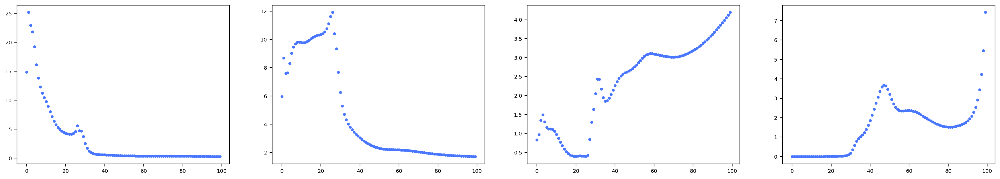

In [280]:
fig, ax = plt.subplots(1,len(Clusters),figsize=(6*len(Clusters),4))
for i,stage in enumerate(Clusters):
    idx = clusters.isin([stage])
    ax[i].plot(traj.Q[idx].sum((0,1)),'.')

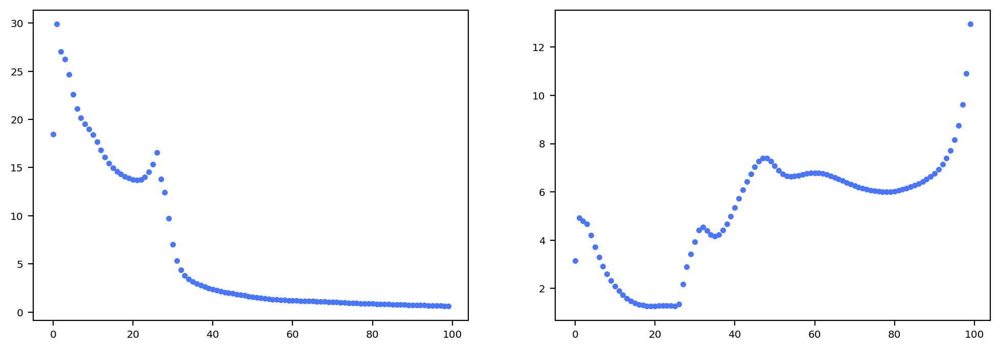

In [281]:
stages = adata.obs.time
Stages = [5,3]
fig, ax = plt.subplots(1,len(Stages),figsize=(6*len(Stages),4))
for i,stage in enumerate(Stages):
    idx = stages.isin([stage])
    ax[i].plot(traj.Q[idx].sum((0,1)),'.')

[Text(0, 0, 'α0'), Text(1, 0, 'α1'), Text(2, 0, 'α2')]

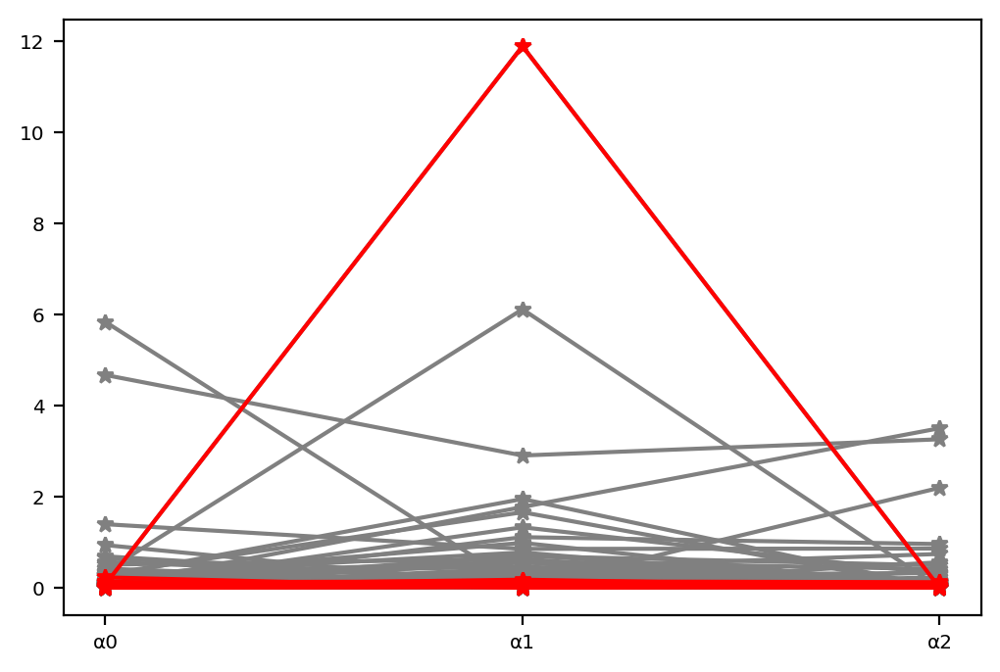

In [282]:
p=X.shape[1]
fig,ax = plt.subplots(1,1)
for j in range(p):
    ax.plot(traj.theta[j,[0,1,2]],'-*',color='gray')
for j in plot_idx:
    ax.plot(traj.theta[j,[0,1,2]],'-*',color='red')

x_label_list = ['α0', 'α1', 'α2']
ax.set_xticks([0,1,2])
ax.set_xticklabels(x_label_list)
#plt.yscale('log')

In [ ]:
#from scipy.spatial import distance

#S = data.X.toarray()
#dist = distance.cdist(S, S, 'minkowski', p=1.)

#order = np.argsort(data.obs["t_hat"])
#sorted_dist = dist[order,:][:,order]
#plt.imshow(sorted_dist,aspect="auto");

#order = np.argsort(data.obs["celltype"])
#sorted_dist = dist[order,:][:,order]
#plt.imshow(sorted_dist,aspect="auto");

## Fitting without prior

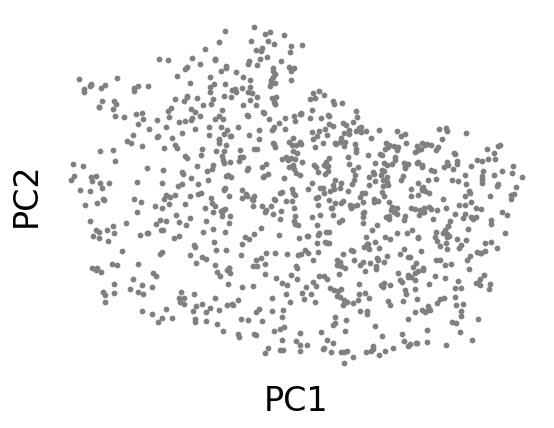

In [118]:
fig, ax = plt.subplots(1,1)
im=ax.scatter(x[:,0],x[:,1],c='grey',s=10);
ax.set_xlabel('PC1',fontsize=24)
ax.set_ylabel('PC2',fontsize=24)
ax.set_frame_on(False)
plt.xticks([]);
plt.yticks([]);

### two_species_ss

In [119]:
from multiprocessing import Pool

tau = (0,1)
topo = np.array([[0,1],[0,2]])
Input_args = []
def fit_wrapper(seed):
    traj = Trajectory(topo, tau, model="two_species_ss", verbose=0)
    traj = traj.fit(X,m=100,n_init=1,fit_tau=True,params=traj_params,perm_theta=False,epoch=100,parallel=False,n_threads=1,seed=seed)
    return traj
    
for seed in range(100):
    Input_args.append([seed])
            
with Pool(20) as pool:      
    trajs = pool.starmap(fit_wrapper, Input_args, chunksize=1)

/tmp/ipykernel_276359/404864149.py:8: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(corrs,elbos,cmap='tab20',s=20,marker='*')


Text(0.5, 1.0, 'Random initialiazation')

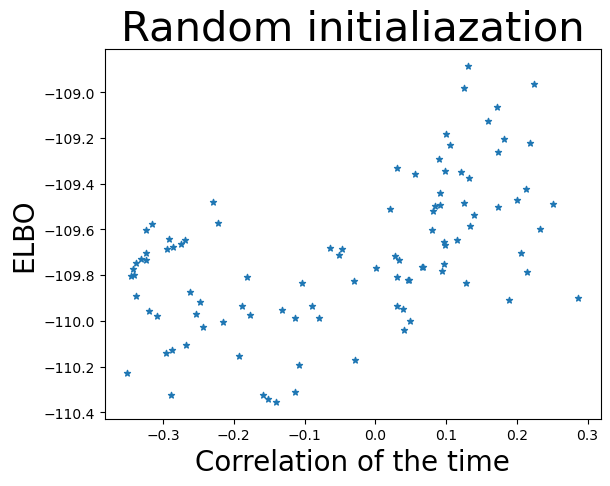

In [120]:
corrs = []
elbos = []
for traj in trajs:
    right_t = Q0.sum(1) @ traj.t
    t_hat = traj.Q.sum(1) @ traj.t
    corrs.append(spearmanr(right_t,t_hat)[0])
    elbos.append( traj.elbos[np.argmax([traj.elbos[i][-1] for i in range(len(traj.elbos))])][-1] )
plt.scatter(corrs,elbos,cmap='tab20',s=20,marker='*')
plt.xlabel('Correlation of the time',fontsize=20)
plt.ylabel('ELBO',fontsize=20)
plt.title('Random initialiazation',fontsize=30)

In [121]:
traj = trajs[np.argmax(elbos)]
np.max(elbos)

-108.88538452495023

[0. 1.]


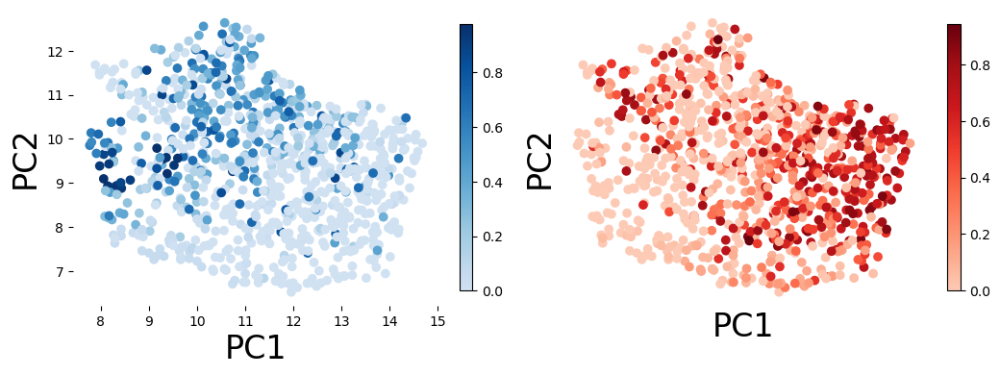

In [125]:
print(traj.tau)
cmap_y = cmr.get_sub_cmap('Blues', 0.2, 1)
fig, ax = plt.subplots(1,2,figsize=(12,4))
im=ax[0].scatter(x[:,0],x[:,1],c=traj.Q[:,0]@traj.t,cmap=cmap_y);
ax[0].set_xlabel('PC1',fontsize=24)
ax[0].set_ylabel('PC2',fontsize=24)
ax[0].set_frame_on(False)
plt.xticks([]);
plt.yticks([]);
plt.colorbar(im,fraction=0.05, shrink =0.9) # adding the colobar on the right

cmap_y = cmr.get_sub_cmap('Reds', 0.2, 1)
im=ax[1].scatter(x[:,0],x[:,1],c=traj.Q[:,1]@traj.t,cmap=cmap_y);
ax[1].set_xlabel('PC1',fontsize=24)
ax[1].set_ylabel('PC2',fontsize=24)
ax[1].set_frame_on(False)

plt.xticks([]);
plt.yticks([]);
plt.colorbar(im,fraction=0.05, shrink =0.9) # adding the colobar on the right

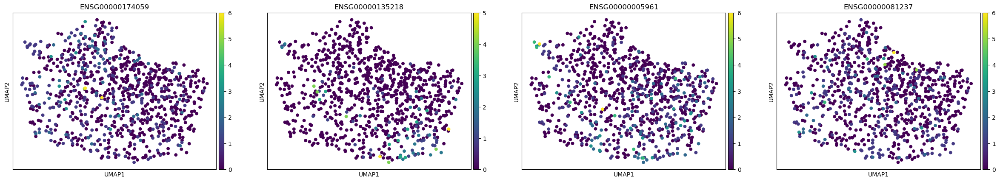

In [126]:
sc.pl.umap(adata,color=marker_genes)

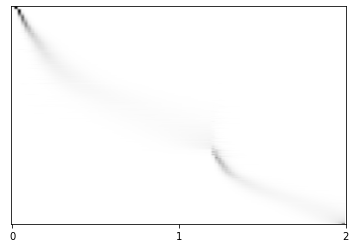

In [165]:
ax = plot_t(traj,l=0,order_cells=True)
x_label_list = ['0', '1', '2']
ax.set_xticks([0,50,100])
ax.set_xticklabels(x_label_list);
ax.set_yticks([]);

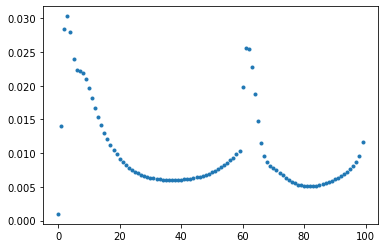

In [166]:
plt.plot(traj.Q.sum((0,1))/traj.Q.sum(),'.')

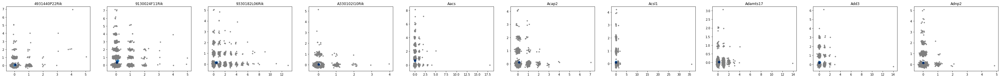

In [167]:
plot_phase(traj,idx=plot_idx,gene_name=fitted_genes);

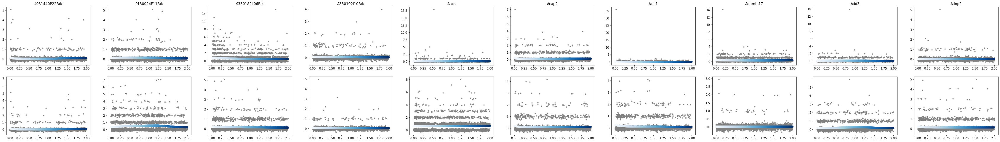

In [168]:
plot_y(traj,idx=plot_idx,gene_name=fitted_genes);

1


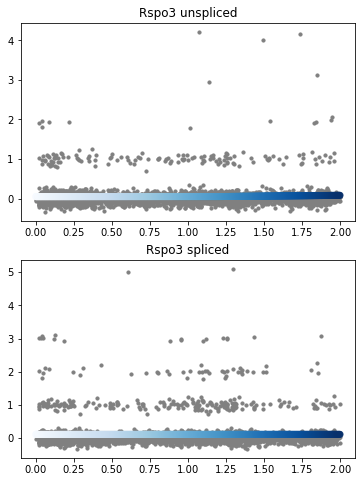

In [169]:
n, p, _ = X.shape
up_mask = (traj.theta[:,2] > 2*traj.theta[:,1]) & (traj.theta[:,1] > 2*traj.theta[:,0])
print(up_mask.sum())
up_idx = np.arange(p)[up_mask]
plot_y(traj,X=X,idx=up_idx[:10],gene_name=fitted_genes);

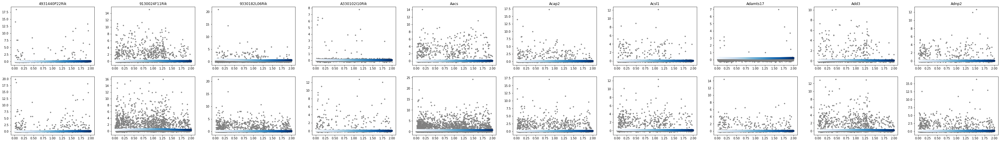

In [170]:
labeling_counts = np.zeros_like(X)
labeling_counts[:,:,0]=adata.layers["new"][:,fitted_idx].toarray()
labeling_counts[:,:,1]=adata.layers["total"][:,fitted_idx].toarray()

plot_y(traj,X=labeling_counts/rd[:,None,None],idx=plot_idx,gene_name=fitted_genes);

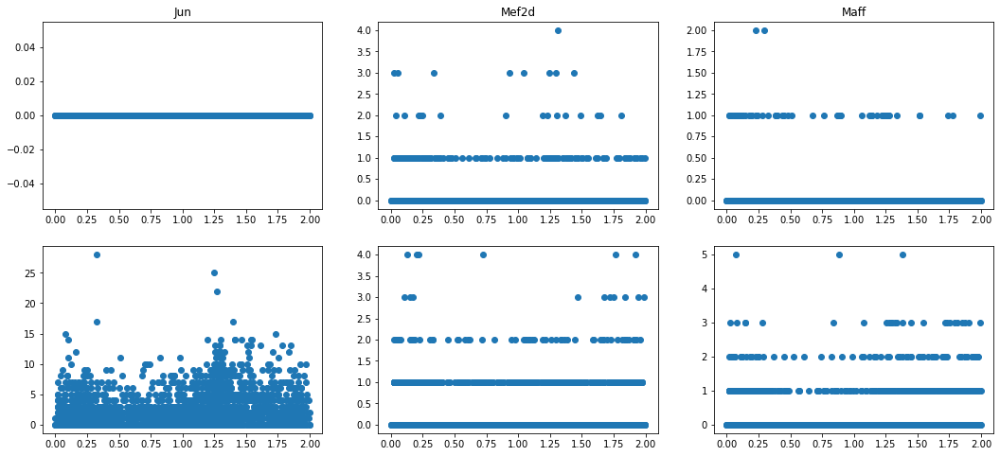

In [172]:
fig,ax = plt.subplots(2,len(plot_marker_genes),figsize=(6*len(plot_marker_genes),8))
for i,gene in enumerate(plot_marker_genes):
    j = np.where(adata.var_names == gene)[0][0]
    ax[0,i].set_title(gene)
    ax[0,i].scatter(traj.Q[:,0]@traj.t,adata.layers["unspliced"].toarray()[:,j])
    ax[1,i].scatter(traj.Q[:,0]@traj.t,adata.layers["spliced"].toarray()[:,j])

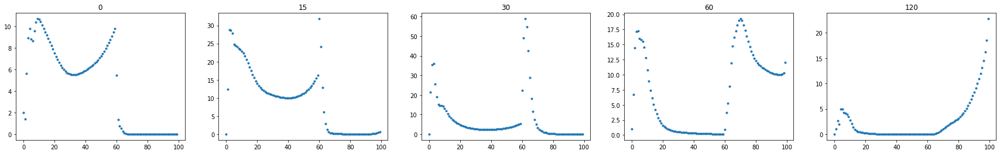

In [183]:
fig, ax = plt.subplots(1,len(Clusters),figsize=(6*len(Clusters),4))
for i,stage in enumerate(Clusters):
    idx = clusters.isin([stage])
    ax[i].plot(traj.Q[idx,0].sum(0),'.')
    ax[i].set_title(stage)

### two_species_ss_tau

In [228]:
tau = (0,24,48)
topo = np.array([[0,1,2]])
Input_args = []

def fit_wrapper(seed):
    traj = Trajectory(topo, tau, model="two_species_ss_tau", verbose=0)
    traj = traj.fit(X,m=100,n_init=1,params=traj_params,perm_theta=False,epoch=100,parallel=False,n_threads=1,seed=seed)
    return traj
    
for seed in range(100):
    Input_args.append([seed])
            
with Pool(20) as pool:      
    trajs = pool.starmap(fit_wrapper, Input_args, chunksize=1)

100%|██████████| 20/20 [20:21<00:00, 61.06s/it]


Text(0.5, 1.0, 'Random initialiazation')

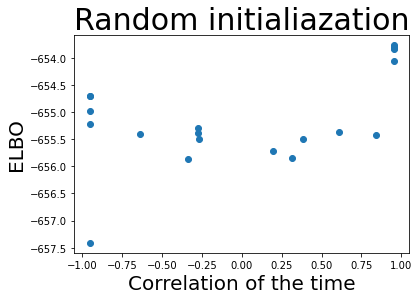

In [229]:
corrs = []
elbos = []
for traj in trajs:
    right_t = Q0[:,0] @ traj.t
    t_hat = traj.Q[:,0] @ traj.t
    corrs.append(spearmanr(right_t,t_hat)[0])
    elbos.append( traj.elbos[np.argmax([traj.elbos[i][-1] for i in range(len(traj.elbos))])][-1] )
plt.scatter(corrs,elbos,cmap='tab20')
plt.xlabel('Correlation of the time',fontsize=20)
plt.ylabel('ELBO',fontsize=20)
plt.title('Random initialiazation',fontsize=30)

In [235]:
traj = trajs[np.argmax(elbos)]

(array([171.,   4.,  17.,  12.,  18.,  34.,   9.,  23.,   9., 196.]),
 array([23.5, 23.6, 23.7, 23.8, 23.9, 24. , 24.1, 24.2, 24.3, 24.4, 24.5]),
 <BarContainer object of 10 artists>)

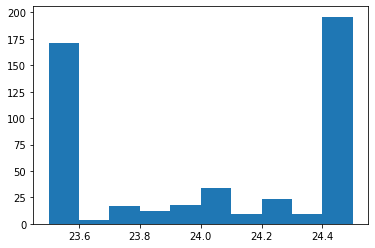

In [236]:
plt.hist(traj.theta[:,-3])

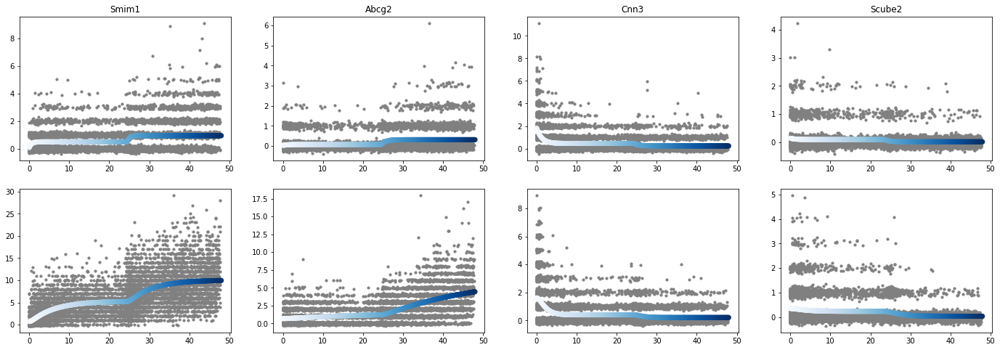

In [237]:
plot_y(traj,idx=plot_idx,gene_name=fitted_genes);

### two_species

In [184]:
tau = (0,1.0,2)
topo = np.array([[0,1,2]])
Input_args = []
def fit_wrapper(seed):
    traj = Trajectory(topo, tau, model="two_species", verbose=0)
    traj = traj.fit(X,m=100,n_init=1,params=traj_params,perm_theta=False,epoch=100,parallel=False,n_threads=1,seed=seed)
    return traj
    
for seed in range(100):
    Input_args.append([seed])
            
with Pool(20) as pool:      
    trajs = pool.starmap(fit_wrapper, Input_args, chunksize=1)

Text(0.5, 1.0, 'Random initialiazation')

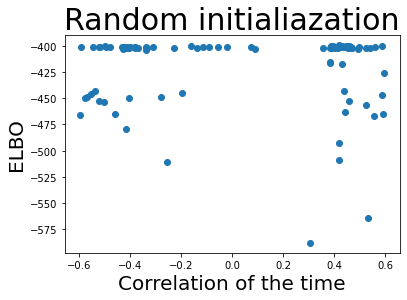

In [185]:
corrs = []
elbos = []
for traj in trajs:
    right_t = Q0[:,0] @ traj.t
    t_hat = traj.Q[:,0] @ traj.t
    corrs.append(spearmanr(right_t,t_hat)[0])
    elbos.append( traj.elbos[np.argmax([traj.elbos[i][-1] for i in range(len(traj.elbos))])][-1] )
plt.scatter(corrs,elbos,cmap='tab20')
plt.xlabel('Correlation of the time',fontsize=20)
plt.ylabel('ELBO',fontsize=20)
plt.title('Random initialiazation',fontsize=30)

In [186]:
traj = trajs[np.argmax(elbos)]
traj.elbos[0][-1]

-399.5085622777261

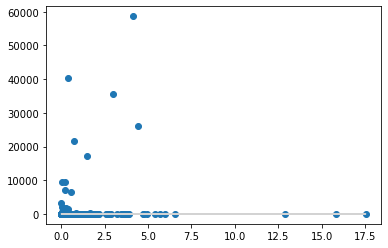

In [187]:
plt.scatter(traj.theta[:,-3],traj.theta[:,0]*traj.theta[:,-2]/traj.theta[:,-1])
plt.plot(traj.theta[:,-3],traj.theta[:,-3],color="lightgray")

In [188]:
traj = trajs[np.argmax(corrs)]
traj.elbos[0][-1]

-425.835010795047

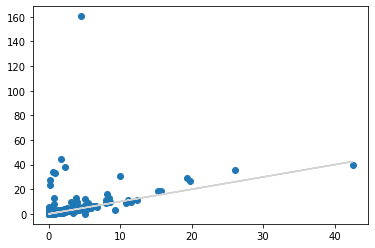

In [256]:
plt.scatter(traj.theta[:,-3],traj.theta[:,0]*traj.theta[:,-2]/traj.theta[:,-1])
plt.plot(traj.theta[:,-3],traj.theta[:,-3],color="lightgray")

# Synthetic data

In [299]:
m=100
weight0 = np.zeros((adata.n_obs,m))
for i,Cluster in enumerate(Clusters):
    idx = clusters.isin([Cluster])
    weight0[idx,int(i*m/len(Clusters)):int((i+1)*m/len(Clusters))] += 1
weight0=weight0/weight0.sum(axis=1,keepdims=True)
#plt.scatter(np.sum(t_grids[None,:]*weight0,axis=1),s,c=colors20[np.mod(clusters, 20)]);
Q0 = weight0[:,None]

topo = np.array([[0,1,2]])
tau = (0,24,48) # ~48 hours
traj = Trajectory(topo, tau, model="two_species_ss",verbose=1)
traj = traj.fit(X,warm_start=True,fit_tau=True,params=traj_params,Q=Q0,parallel=True,n_threads=4,epoch=10)

fitting with warm start


100%|██████████| 10/10 [00:50<00:00,  5.08s/it]


In [301]:
print(traj.elbos[-1])

-658.4752472018502


[ 0.         23.94425778 48.        ]


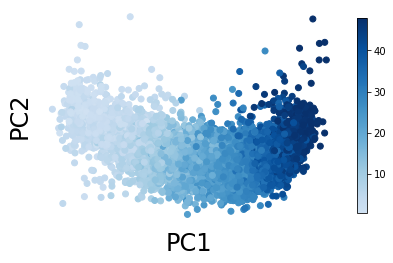

In [300]:
print(traj.tau)
cmap_y = cmr.get_sub_cmap('Blues', 0.2, 1)
fig, ax = plt.subplots(1,1)
im=ax.scatter(x[:,0],x[:,1],c=traj.Q[:,0]@traj.t,cmap=cmap_y);
ax.set_xlabel('PC1',fontsize=24)
ax.set_ylabel('PC2',fontsize=24)
ax.set_frame_on(False)
plt.xticks([]);
plt.yticks([]);
plt.colorbar(im,fraction=0.05, shrink =0.9) # adding the colobar on the right

<AxesSubplot:>

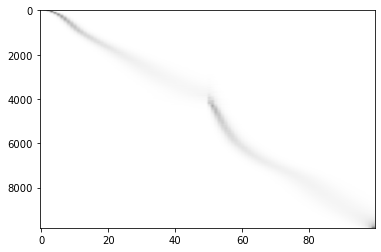

In [302]:
plot_t(traj,order_cells=True)

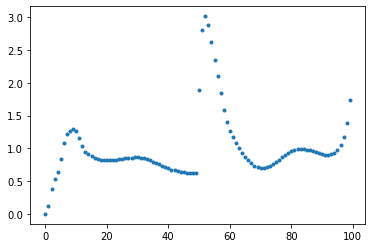

In [303]:
plt.plot(traj.Q.sum((0,1))/traj.Q.sum()*traj.m,'.')

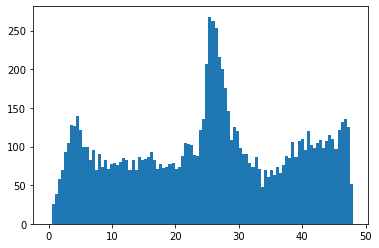

In [304]:
Y = traj.get_Y_hat(theta=traj.theta,t=traj.Q[:,0]@traj.t,tau=traj.tau,topo=traj.topo,params=traj.params)
syn_X = np.random.poisson(rd[:,None,None]*Y[0])
syn_t = traj.Q[:,0]@traj.t
plt.hist(syn_t,bins=traj.t);

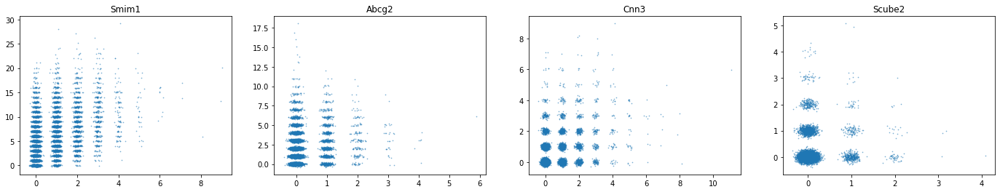

In [307]:
pp = min(10,len(plot_idx))
fix, ax = plt.subplots(1,pp,figsize=(6*pp,4))
for i in range(pp):
    j = plot_idx[i]
    ax[i].set_title(fitted_genes[j])
    ax[i].scatter(X[:,j,0]+np.random.normal(0,0.1,X.shape[0]),X[:,j,1]+np.random.normal(0,0.1,X.shape[0]),s=0.5,alpha=0.5) #,c=adata.obs['louvain'])

In [309]:
syn_tau = traj.tau.copy()
syn_topo = traj.topo.copy()

Input_args = []
def fit_wrapper(seed):
    syn_traj = Trajectory(syn_topo, syn_tau, model="two_species_ss", verbose=0)
    syn_traj = syn_traj.fit(syn_X,m=100,n_init=1,params=traj_params,perm_theta=False,epoch=100,parallel=False,n_threads=1,seed=seed)
    return syn_traj
    
for seed in range(100):
    Input_args.append([seed])
            
with Pool(20) as pool:      
    syn_trajs = pool.starmap(fit_wrapper, Input_args, chunksize=1)

100%|██████████| 20/20 [12:44<00:00, 38.21s/it]


Text(0.5, 1.0, 'Random initialiazation')

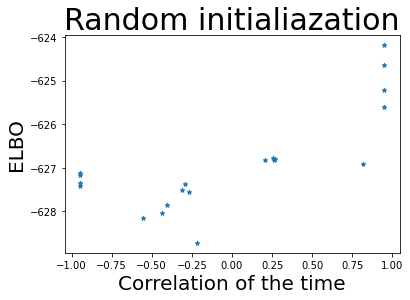

In [310]:
corrs = []
elbos = []
for syn_traj in syn_trajs:
    right_t = syn_t
    t_hat = syn_traj.Q[:,0] @ syn_traj.t
    corrs.append(spearmanr(right_t,t_hat)[0])
    elbos.append( syn_traj.elbos[np.argmax([syn_traj.elbos[i][-1] for i in range(len(syn_traj.elbos))])][-1] )
plt.scatter(corrs,elbos,cmap='tab20',s=20,marker='*')
plt.xlabel('Correlation of the time',fontsize=20)
plt.ylabel('ELBO',fontsize=20)
plt.title('Random initialiazation',fontsize=30)